# --Julia for Data Science--

by Anshul Joshi(September, 2016)

> Most of Julia's core is implemented in **C/C++**. Julia's parser is written in **Scheme**. Julia's efficient and cross-platform I/O is provided by the **Node.js**'s **libuv**

> A Julia library, or custom-written Julia program, can be included in the **REPL** (Read-Eval-Print-Loop) using **include**

> Julia also stores all the commands written in the REPL in the **.julia_history**. This file is located at ~/.julia_history on macOS

> Ctrl + R: reverse search; Ctrl + L: clear the screen; Ctrl + D (or exit()): come out of the REPL

-------------------------------
# Basic
-------------------------------

-------------------------------
**1 Data Munging**

> It involves **collecting**, **aggregating**, **cleaning**, and **organizing** the data to be consumed by the algorithms designed to make discoveries or to create models. This involves numerous steps, including extracting data from the data source and then parsing or transforming the data into a predefined data structure;

> This data aggregation phase includes **scraping** it from websites, downloading thousands of .txt or .log files, or gathering the data from RDBMS or NoSQL data stores;

> The algorithms that you have designed or will be designing should not just be able to accept this format of data, but they should also be able to easily identify the **patterns**, find the **outliers**, **make discoveries**, or meet whatever the desired outcomes are;

* DataFrame: a data structure that has labeled columns, which individually may have different data types. Like a SQL table or a spreadsheet, it has two dimensions

In [1]:
x = [1.1, 2.2, 3.3, 4.4, 5.5, 6.6]
x[1] = NA

LoadError: UndefVarError: NA not defined

In [2]:
using DataArrays
x = DataArray([1.1, 2.2, 3.3, 4.4, 5.5, 6.6])
x[1] = NA
x

6-element DataArrays.DataArray{Float64,1}:
  NA
 2.2
 3.3
 4.4
 5.5
 6.6

In [7]:
true || x
true && x[1]
mean(x)

# slicing
mean(x[2:6])

4.4

In [11]:
# Type aliases of Vector (one-dimensional Array type)
# and Matrix (two-dimensional Array type) are DataVector and DataMatrix provided by DataArray

dvector = data([10, 20, 30, 40, 50])
dmatrix = data([10 20 30; 40 50 60])
dmatrix[2,3]

60

In [12]:
dropna(x)

5-element Array{Float64,1}:
 2.2
 3.3
 4.4
 5.5
 6.6

In [1]:
using DataFrames
df = DataFrame(Name = ["Ajava Rhodiumhi", "Las Hushjoin"],
               Count = [14.04, 17.3],
               OS = ["Ubuntu", "Mint"])

,Name,Count,OS
1,Ajava Rhodiumhi,14.04,Ubuntu
2,Las Hushjoin,17.3,Mint


In [2]:
df2 = DataFrame()
df2[:X] = 1:10
df2[:Y] = ["Head", "Tail",
   "Head", "Head",
   "Tail", "Head",
   "Tail", "Tail",
   "Head", "Tail"]
df2

,X,Y
1,1,Head
2,2,Tail
3,3,Head
4,4,Head
5,5,Tail
6,6,Head
7,7,Tail
8,8,Tail
9,9,Head
10,10,Tail


In [17]:
size(df2)

(10,2)

In [18]:
head(df2)

,X,Y
1,1,Head
2,2,Tail
3,3,Head
4,4,Head
5,5,Tail
6,6,Head


In [19]:
tail(df2)

,X,Y
1,5,Tail
2,6,Head
3,7,Tail
4,8,Tail
5,9,Head
6,10,Tail


In [24]:
df2[:X]

10-element DataArrays.DataArray{Int64,1}:
  1
  2
  3
  4
  5
  6
  7
  8
  9
 10

In [29]:
rename!(df2,:X,:newX)

,newX,Y
1,1,Head
2,2,Tail
3,3,Head
4,4,Head
5,5,Tail
6,6,Head
7,7,Tail
8,8,Tail
9,9,Head
10,10,Tail


In [30]:
rename!(df2,:newX,:X)

,X,Y
1,1,Head
2,2,Tail
3,3,Head
4,4,Head
5,5,Tail
6,6,Head
7,7,Tail
8,8,Tail
9,9,Head
10,10,Tail


In [33]:
rename!(df2, [:X => :newX, :Y => :newY])

,newX,newY
1,1,Head
2,2,Tail
3,3,Head
4,4,Head
5,5,Tail
6,6,Head
7,7,Tail
8,8,Tail
9,9,Head
10,10,Tail


In [34]:
describe(df2)

newX
Min      1.0
1st Qu.  3.25
Median   5.5
Mean     5.5
3rd Qu.  7.75
Max      10.0
NAs      0
NA%      0.0%

newY
Length  10
Type    String
NAs     0
NA%     0.0%
Unique  2



In [3]:
using RDatasets
RDatasets.packages()

,Package,Title
1,COUNT,"Functions, data and code for count data."
2,Ecdat,Data sets for econometrics
3,HSAUR,A Handbook of Statistical Analyses Using R (1st Edition)
4,HistData,Data sets from the history of statistics and data visualization
5,ISLR,Data for An Introduction to Statistical Learning with Applications in R
6,KMsurv,"Data sets from Klein and Moeschberger (1997), Survival Analysis"
7,MASS,Support Functions and Datasets for Venables and Ripley's MASS
8,SASmixed,"Data sets from ""SAS System for Mixed Models"""
9,Zelig,Everyone's Statistical Software
10,adehabitatLT,Analysis of Animal Movements


In [4]:
iris_dataset = dataset("datasets","iris")
tail(iris_dataset)

,SepalLength,SepalWidth,PetalLength,PetalWidth,Species
1,6.7,3.3,5.7,2.5,virginica
2,6.7,3.0,5.2,2.3,virginica
3,6.3,2.5,5.0,1.9,virginica
4,6.5,3.0,5.2,2.0,virginica
5,6.2,3.4,5.4,2.3,virginica
6,5.9,3.0,5.1,1.8,virginica


* **readtable()**: used to read a tabular file in a dataframe. give the location of the file as **UTF8String** and the separator type to the readtable() function as arguments. The default separator type is comma (',') for **CSV**, tab ('\t') for **TSV**, and whitespace (' ') for **WSV**; if we have a dataset without a header and separated by ; then readtable(".txt", header = false, separator = ';')

* [Iris dataset](https://github. com/scikit-learn/scikit-learn/blob/master/sklearn/datasets/data/iris.csv)

In [5]:
df_iris_sample = readtable("iris_sample.csv", separator = ',')
df_iris_sample

,x150,x4,setosa,versicolor,virginica
1,5.1,3.5,1.4,0.2,0
2,4.9,3.0,1.4,0.2,0
3,4.7,3.2,1.3,0.2,0
4,4.6,3.1,1.5,0.2,0
5,5.0,3.6,1.4,0.2,0
6,5.4,3.9,1.7,0.4,0
7,4.6,3.4,1.4,0.3,0
8,5.0,3.4,1.5,0.2,0
9,4.4,2.9,1.4,0.2,0
10,4.9,3.1,1.5,0.1,0


In [48]:
methods(readtable)

# 3 methods for generic function "readtable":
readtable(io::IO) at /Users/brucelee/.julia/v0.5/DataFrames/src/dataframe/io.jl:820
readtable(io::IO, nbytes::Integer; header, separator, quotemark, decimal, nastrings, truestrings, falsestrings, makefactors, nrows, names, eltypes, allowcomments, commentmark, ignorepadding, skipstart, skiprows, skipblanks, encoding, allowescapes, normalizenames) at /Users/brucelee/.julia/v0.5/DataFrames/src/dataframe/io.jl:820
readtable(pathname::AbstractString; header, separator, quotemark, decimal, nastrings, truestrings, falsestrings, makefactors, nrows, names, eltypes, allowcomments, commentmark, ignorepadding, skipstart, skiprows, skipblanks, encoding, allowescapes, normalizenames) at /Users/brucelee/.julia/v0.5/DataFrames/src/dataframe/io.jl:930

In [49]:
writetable("output_df_iris.csv",df_iris_sample)

* [Road Safety Data](https://data.gov.uk/dataset/road-accidents-safety-data) published by the Department for Transport, UK, and it is open under the OGL-Open Government Licence

In [1]:
using DataFrames

Accidents_2015 = readtable("Accidents_2015.csv")
head(Accidents_2015)

,Accident_Index,Location_Easting_OSGR,Location_Northing_OSGR,Longitude,Latitude,Police_Force,Accident_Severity,Number_of_Vehicles,Number_of_Casualties,Date,Day_of_Week,Time,Local_Authority_District_,Local_Authority_Highway_,x1st_Road_Class,x1st_Road_Number,Road_Type,Speed_limit,Junction_Detail,Junction_Control,x2nd_Road_Class,x2nd_Road_Number,Pedestrian_Crossing_Human_Control,Pedestrian_Crossing_Physical_Facilities,Light_Conditions,Weather_Conditions,Road_Surface_Conditions,Special_Conditions_at_Site,Carriageway_Hazards,Urban_or_Rural_Area,Did_Police_Officer_Attend_Scene_of_Accident,LSOA_of_Accident_Location
1,201501BS70001,525130,180050,-0.198465,51.505538,1,3,1,1,12/01/2015,2,18:45,12,E09000020,5,0,6,30,3,4,6,0,0,0,4,1,1,0,0,1,1,E01002825
2,201501BS70002,526530,178560,-0.178838,51.491836,1,3,1,1,12/01/2015,2,07:50,12,E09000020,6,0,6,30,3,4,3,3218,0,0,1,1,1,0,0,1,1,E01002820
3,201501BS70004,524610,181080,-0.20559,51.51491,1,3,1,1,12/01/2015,2,18:08,12,E09000020,4,415,6,30,2,4,6,0,0,1,4,2,2,0,0,1,1,E01002833
4,201501BS70005,524420,181080,-0.208327,51.514952,1,3,1,1,13/01/2015,3,07:40,12,E09000020,4,450,6,30,6,4,6,0,0,0,1,1,2,0,0,1,2,E01002874
5,201501BS70008,524630,179040,-0.206022,51.496572,1,2,2,1,09/01/2015,6,07:30,12,E09000020,3,315,6,30,6,2,3,3220,0,5,1,2,2,0,0,1,2,E01002814
6,201501BS70009,525480,179530,-0.19361,51.500788,1,3,2,1,15/01/2015,5,09:56,12,E09000020,3,315,6,30,3,4,5,0,0,4,1,1,2,0,0,1,1,E01002816


In [52]:
names(Accidents_2015)

32-element Array{Symbol,1}:
 :Accident_Index                             
 :Location_Easting_OSGR                      
 :Location_Northing_OSGR                     
 :Longitude                                  
 :Latitude                                   
 :Police_Force                               
 :Accident_Severity                          
 :Number_of_Vehicles                         
 :Number_of_Casualties                       
 :Date                                       
 :Day_of_Week                                
 :Time                                       
 :Local_Authority_District_                  
 ⋮                                           
 :x2nd_Road_Class                            
 :x2nd_Road_Number                           
 :Pedestrian_Crossing_Human_Control          
 :Pedestrian_Crossing_Physical_Facilities    
 :Light_Conditions                           
 :Weather_Conditions                         
 :Road_Surface_Conditions                    
 :Spec

In [2]:
Vehicles_2015 = readtable("Vehicles_2015.csv")
head(Vehicles_2015)

,Accident_Index,Vehicle_Reference,Vehicle_Type,Towing_and_Articulation,Vehicle_Manoeuvre,Vehicle_Location_Restricted_Lane,Junction_Location,Skidding_and_Overturning,Hit_Object_in_Carriageway,Vehicle_Leaving_Carriageway,Hit_Object_off_Carriageway,x1st_Point_of_Impact,Was_Vehicle_Left_Hand_Drive_,Journey_Purpose_of_Driver,Sex_of_Driver,Age_of_Driver,Age_Band_of_Driver,Engine_Capacity_CC_,Propulsion_Code,Age_of_Vehicle,Driver_IMD_Decile,Driver_Home_Area_Type,Vehicle_IMD_Decile
1,201506E098757,2,9,0,18,0,8,0,0,0,0,3,1,6,1,45,7,1794,1,11,-1,1,-1
2,201506E098766,1,9,0,9,0,8,0,0,0,0,4,1,6,2,25,5,1582,2,1,-1,-1,-1
3,201506E098766,2,9,0,18,0,8,0,0,0,0,1,1,6,1,51,8,-1,-1,-1,-1,1,-1
4,201506E098777,1,20,0,4,0,0,0,0,0,0,1,1,1,1,50,8,4462,2,1,-1,1,-1
5,201506E098780,1,9,0,15,0,1,0,0,0,0,4,1,6,1,27,6,1598,2,-1,-1,1,-1
6,201506E098780,2,1,0,9,0,5,0,0,0,0,1,1,6,1,46,8,-1,-1,-1,-1,1,-1


In [54]:
names(Vehicles_2015)

23-element Array{Symbol,1}:
 :Accident_Index                  
 :Vehicle_Reference               
 :Vehicle_Type                    
 :Towing_and_Articulation         
 :Vehicle_Manoeuvre               
 :Vehicle_Location_Restricted_Lane
 :Junction_Location               
 :Skidding_and_Overturning        
 :Hit_Object_in_Carriageway       
 :Vehicle_Leaving_Carriageway     
 :Hit_Object_off_Carriageway      
 :x1st_Point_of_Impact            
 :Was_Vehicle_Left_Hand_Drive_    
 :Journey_Purpose_of_Driver       
 :Sex_of_Driver                   
 :Age_of_Driver                   
 :Age_Band_of_Driver              
 :Engine_Capacity_CC_             
 :Propulsion_Code                 
 :Age_of_Vehicle                  
 :Driver_IMD_Decile               
 :Driver_Home_Area_Type           
 :Vehicle_IMD_Decile              

* A join between these two datasets will tell us which accident involved which vehicles

> Inner join

> Left join

> Right join

> Outer join

> Semi join

> Anti join

> Cross join

In [3]:
full_RoadSafety_2015 = join(Accidents_2015, Vehicles_2015, on = :Accident_Index)
head(full_RoadSafety_2015)

,Accident_Index,Location_Easting_OSGR,Location_Northing_OSGR,Longitude,Latitude,Police_Force,Accident_Severity,Number_of_Vehicles,Number_of_Casualties,Date,Day_of_Week,Time,Local_Authority_District_,Local_Authority_Highway_,x1st_Road_Class,x1st_Road_Number,Road_Type,Speed_limit,Junction_Detail,Junction_Control,x2nd_Road_Class,x2nd_Road_Number,Pedestrian_Crossing_Human_Control,Pedestrian_Crossing_Physical_Facilities,Light_Conditions,Weather_Conditions,Road_Surface_Conditions,Special_Conditions_at_Site,Carriageway_Hazards,Urban_or_Rural_Area,Did_Police_Officer_Attend_Scene_of_Accident,LSOA_of_Accident_Location,Vehicle_Reference,Vehicle_Type,Towing_and_Articulation,Vehicle_Manoeuvre,Vehicle_Location_Restricted_Lane,Junction_Location,Skidding_and_Overturning,Hit_Object_in_Carriageway,Vehicle_Leaving_Carriageway,Hit_Object_off_Carriageway,x1st_Point_of_Impact,Was_Vehicle_Left_Hand_Drive_,Journey_Purpose_of_Driver,Sex_of_Driver,Age_of_Driver,Age_Band_of_Driver,Engine_Capacity_CC_,Propulsion_Code,Age_of_Vehicle,Driver_IMD_Decile,Driver_Home_Area_Type,Vehicle_IMD_Decile
1,201501BS70001,525130,180050,-0.198465,51.505538,1,3,1,1,12/01/2015,2,18:45,12,E09000020,5,0,6,30,3,4,6,0,0,0,4,1,1,0,0,1,1,E01002825,1,19,0,9,0,8,0,0,0,0,1,1,1,1,-1,-1,2143,2,4,-1,-1,-1
2,201501BS70002,526530,178560,-0.178838,51.491836,1,3,1,1,12/01/2015,2,07:50,12,E09000020,6,0,6,30,3,4,3,3218,0,0,1,1,1,0,0,1,1,E01002820,1,9,0,9,0,8,0,0,0,0,1,1,6,1,-1,-1,1600,1,3,-1,-1,-1
3,201501BS70004,524610,181080,-0.20559,51.51491,1,3,1,1,12/01/2015,2,18:08,12,E09000020,4,415,6,30,2,4,6,0,0,1,4,2,2,0,0,1,1,E01002833,1,9,0,9,0,2,0,0,0,0,1,1,6,1,30,6,1686,2,10,-1,1,-1
4,201501BS70005,524420,181080,-0.208327,51.514952,1,3,1,1,13/01/2015,3,07:40,12,E09000020,4,450,6,30,6,4,6,0,0,0,1,1,2,0,0,1,2,E01002874,1,9,0,9,0,2,0,0,0,0,1,1,6,1,-1,-1,-1,-1,-1,-1,-1,-1
5,201501BS70008,524630,179040,-0.206022,51.496572,1,2,2,1,09/01/2015,6,07:30,12,E09000020,3,315,6,30,6,2,3,3220,0,5,1,2,2,0,0,1,2,E01002814,1,1,0,18,0,8,0,0,0,0,0,1,2,1,48,8,-1,-1,-1,-1,1,-1
6,201501BS70008,524630,179040,-0.206022,51.496572,1,2,2,1,09/01/2015,6,07:30,12,E09000020,3,315,6,30,6,2,3,3220,0,5,1,2,2,0,0,1,2,E01002814,2,9,0,7,0,8,0,0,0,0,0,1,6,1,-1,-1,-1,-1,-1,-1,-1,-1


In [56]:
names(full_RoadSafety_2015)

54-element Array{Symbol,1}:
 :Accident_Index              
 :Location_Easting_OSGR       
 :Location_Northing_OSGR      
 :Longitude                   
 :Latitude                    
 :Police_Force                
 :Accident_Severity           
 :Number_of_Vehicles          
 :Number_of_Casualties        
 :Date                        
 :Day_of_Week                 
 :Time                        
 :Local_Authority_District_   
 ⋮                            
 :x1st_Point_of_Impact        
 :Was_Vehicle_Left_Hand_Drive_
 :Journey_Purpose_of_Driver   
 :Sex_of_Driver               
 :Age_of_Driver               
 :Age_Band_of_Driver          
 :Engine_Capacity_CC_         
 :Propulsion_Code             
 :Age_of_Vehicle              
 :Driver_IMD_Decile           
 :Driver_Home_Area_Type       
 :Vehicle_IMD_Decile          

In [5]:
left_RoadSafety_2015 = join(Accidents_2015, Vehicles_2015, on = :Accident_Index, kind = :left)
head(left_RoadSafety_2015)

,Accident_Index,Location_Easting_OSGR,Location_Northing_OSGR,Longitude,Latitude,Police_Force,Accident_Severity,Number_of_Vehicles,Number_of_Casualties,Date,Day_of_Week,Time,Local_Authority_District_,Local_Authority_Highway_,x1st_Road_Class,x1st_Road_Number,Road_Type,Speed_limit,Junction_Detail,Junction_Control,x2nd_Road_Class,x2nd_Road_Number,Pedestrian_Crossing_Human_Control,Pedestrian_Crossing_Physical_Facilities,Light_Conditions,Weather_Conditions,Road_Surface_Conditions,Special_Conditions_at_Site,Carriageway_Hazards,Urban_or_Rural_Area,Did_Police_Officer_Attend_Scene_of_Accident,LSOA_of_Accident_Location,Vehicle_Reference,Vehicle_Type,Towing_and_Articulation,Vehicle_Manoeuvre,Vehicle_Location_Restricted_Lane,Junction_Location,Skidding_and_Overturning,Hit_Object_in_Carriageway,Vehicle_Leaving_Carriageway,Hit_Object_off_Carriageway,x1st_Point_of_Impact,Was_Vehicle_Left_Hand_Drive_,Journey_Purpose_of_Driver,Sex_of_Driver,Age_of_Driver,Age_Band_of_Driver,Engine_Capacity_CC_,Propulsion_Code,Age_of_Vehicle,Driver_IMD_Decile,Driver_Home_Area_Type,Vehicle_IMD_Decile
1,201501BS70001,525130,180050,-0.198465,51.505538,1,3,1,1,12/01/2015,2,18:45,12,E09000020,5,0,6,30,3,4,6,0,0,0,4,1,1,0,0,1,1,E01002825,1,19,0,9,0,8,0,0,0,0,1,1,1,1,-1,-1,2143,2,4,-1,-1,-1
2,201501BS70002,526530,178560,-0.178838,51.491836,1,3,1,1,12/01/2015,2,07:50,12,E09000020,6,0,6,30,3,4,3,3218,0,0,1,1,1,0,0,1,1,E01002820,1,9,0,9,0,8,0,0,0,0,1,1,6,1,-1,-1,1600,1,3,-1,-1,-1
3,201501BS70004,524610,181080,-0.20559,51.51491,1,3,1,1,12/01/2015,2,18:08,12,E09000020,4,415,6,30,2,4,6,0,0,1,4,2,2,0,0,1,1,E01002833,1,9,0,9,0,2,0,0,0,0,1,1,6,1,30,6,1686,2,10,-1,1,-1
4,201501BS70005,524420,181080,-0.208327,51.514952,1,3,1,1,13/01/2015,3,07:40,12,E09000020,4,450,6,30,6,4,6,0,0,0,1,1,2,0,0,1,2,E01002874,1,9,0,9,0,2,0,0,0,0,1,1,6,1,-1,-1,-1,-1,-1,-1,-1,-1
5,201501BS70008,524630,179040,-0.206022,51.496572,1,2,2,1,09/01/2015,6,07:30,12,E09000020,3,315,6,30,6,2,3,3220,0,5,1,2,2,0,0,1,2,E01002814,1,1,0,18,0,8,0,0,0,0,0,1,2,1,48,8,-1,-1,-1,-1,1,-1
6,201501BS70008,524630,179040,-0.206022,51.496572,1,2,2,1,09/01/2015,6,07:30,12,E09000020,3,315,6,30,6,2,3,3220,0,5,1,2,2,0,0,1,2,E01002814,2,9,0,7,0,8,0,0,0,0,0,1,6,1,-1,-1,-1,-1,-1,-1,-1,-1


In [6]:
names(left_RoadSafety_2015)

54-element Array{Symbol,1}:
 :Accident_Index              
 :Location_Easting_OSGR       
 :Location_Northing_OSGR      
 :Longitude                   
 :Latitude                    
 :Police_Force                
 :Accident_Severity           
 :Number_of_Vehicles          
 :Number_of_Casualties        
 :Date                        
 :Day_of_Week                 
 :Time                        
 :Local_Authority_District_   
 ⋮                            
 :x1st_Point_of_Impact        
 :Was_Vehicle_Left_Hand_Drive_
 :Journey_Purpose_of_Driver   
 :Sex_of_Driver               
 :Age_of_Driver               
 :Age_Band_of_Driver          
 :Engine_Capacity_CC_         
 :Propulsion_Code             
 :Age_of_Vehicle              
 :Driver_IMD_Decile           
 :Driver_Home_Area_Type       
 :Vehicle_IMD_Decile          

In [13]:
Cities = ["Delhi","Amsterdam","Hamburg"][rand(1:3, 10)]

df1 = DataFrame(Any[1:10, Cities, rand(10)], [:ID, :City, :RandomValue1])
df2 = DataFrame(ID = 1:10, City = Cities, RandomValue2 = rand(100:110, 10))

,ID,City,RandomValue2
1,1,Amsterdam,108
2,2,Delhi,107
3,3,Delhi,107
4,4,Hamburg,108
5,5,Hamburg,109
6,6,Hamburg,100
7,7,Amsterdam,108
8,8,Hamburg,108
9,9,Amsterdam,110
10,10,Hamburg,106


In [14]:
full_df1_df2 = join(df1, df2, on = [:ID, :City])

,ID,City,RandomValue1,RandomValue2
1,1,Amsterdam,0.142385165341532,108
2,7,Amsterdam,0.8948746993104684,108
3,9,Amsterdam,0.47316256556825875,110
4,2,Delhi,0.365068776794643,107
5,3,Delhi,0.1534347740855979,107
6,4,Hamburg,0.08869112991938377,108
7,5,Hamburg,0.9956177684426173,109
8,6,Hamburg,0.884180099300997,100
9,8,Hamburg,0.38982130034641305,108
10,10,Hamburg,0.9620594124114294,106


* Wickham, Hadley. “**The split-apply-combine strategy for data analysis.**” Journal of Statistical Software 40.1 (2011): 1-29

In [59]:
by(Accidents_2015, :Location_Northing_OSGR, size)

,Location_Northing_OSGR,x1
1,NA,"(27,32)"
2,10628,"(1,32)"
3,18201,"(1,32)"
4,19648,"(1,32)"
5,19868,"(1,32)"
6,19871,"(1,32)"
7,20148,"(1,32)"
8,20441,"(1,32)"
9,23024,"(1,32)"
10,23494,"(1,32)"


In [64]:
aggregate(Accidents_2015, :Location_Northing_OSGR, size)

,Location_Northing_OSGR,Accident_Index_size,Location_Easting_OSGR_size,Longitude_size,Latitude_size,Police_Force_size,Accident_Severity_size,Number_of_Vehicles_size,Number_of_Casualties_size,Date_size,Day_of_Week_size,Time_size,Local_Authority_District__size,Local_Authority_Highway__size,x1st_Road_Class_size,x1st_Road_Number_size,Road_Type_size,Speed_limit_size,Junction_Detail_size,Junction_Control_size,x2nd_Road_Class_size,x2nd_Road_Number_size,Pedestrian_Crossing_Human_Control_size,Pedestrian_Crossing_Physical_Facilities_size,Light_Conditions_size,Weather_Conditions_size,Road_Surface_Conditions_size,Special_Conditions_at_Site_size,Carriageway_Hazards_size,Urban_or_Rural_Area_size,Did_Police_Officer_Attend_Scene_of_Accident_size,LSOA_of_Accident_Location_size
1,NA,"(27,)","(27,)","(27,)","(27,)","(27,)","(27,)","(27,)","(27,)","(27,)","(27,)","(27,)","(27,)","(27,)","(27,)","(27,)","(27,)","(27,)","(27,)","(27,)","(27,)","(27,)","(27,)","(27,)","(27,)","(27,)","(27,)","(27,)","(27,)","(27,)","(27,)","(27,)"
2,10628,"(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)"
3,18201,"(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)"
4,19648,"(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)"
5,19868,"(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)"
6,19871,"(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)"
7,20148,"(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)"
8,20441,"(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)"
9,23024,"(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)"
10,23494,"(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)","(1,)"


In [22]:
using DataFrames, RDatasets

# Stack works by creating a dataframe for categorical variables with all of the information one by one
iris_df = dataset("datasets","iris")
iris_stackdf = stackdf(iris_df)

,variable,value,Species
1,SepalLength,5.1,setosa
2,SepalLength,4.9,setosa
3,SepalLength,4.7,setosa
4,SepalLength,4.6,setosa
5,SepalLength,5.0,setosa
6,SepalLength,5.4,setosa
7,SepalLength,4.6,setosa
8,SepalLength,5.0,setosa
9,SepalLength,4.4,setosa
10,SepalLength,4.9,setosa


In [45]:
iris_df[:id] = 1:size(iris_df, 1)
iris_stack = stack(iris_df)
size(iris_stack)
head(iris_stack)
iris_stack[290:310,:]

,variable,value,Species,id
1,SepalWidth,3.1,virginica,140
2,SepalWidth,3.1,virginica,141
3,SepalWidth,3.1,virginica,142
4,SepalWidth,2.7,virginica,143
5,SepalWidth,3.2,virginica,144
6,SepalWidth,3.3,virginica,145
7,SepalWidth,3.0,virginica,146
8,SepalWidth,2.5,virginica,147
9,SepalWidth,3.0,virginica,148
10,SepalWidth,3.4,virginica,149


In [48]:
iris = dataset("datasets", "iris")
iris_stack_option = stack(iris, [:PetalLength, :PetalWidth], :Species) 

,variable,value,Species
1,PetalLength,1.4,setosa
2,PetalLength,1.4,setosa
3,PetalLength,1.3,setosa
4,PetalLength,1.5,setosa
5,PetalLength,1.4,setosa
6,PetalLength,1.7,setosa
7,PetalLength,1.4,setosa
8,PetalLength,1.5,setosa
9,PetalLength,1.4,setosa
10,PetalLength,1.5,setosa


In [50]:
# similar to the stack function but has some special features
iris_melt = melt(iris_df)

,variable,value,Species,id
1,SepalLength,5.1,setosa,1
2,SepalLength,4.9,setosa,2
3,SepalLength,4.7,setosa,3
4,SepalLength,4.6,setosa,4
5,SepalLength,5.0,setosa,5
6,SepalLength,5.4,setosa,6
7,SepalLength,4.6,setosa,7
8,SepalLength,5.0,setosa,8
9,SepalLength,4.4,setosa,9
10,SepalLength,4.9,setosa,10


In [51]:
unstack(iris_melt, :id, :variable, :value)

,id,PetalLength,PetalWidth,SepalLength,SepalWidth
1,1,1.4,0.2,5.1,3.5
2,2,1.4,0.2,4.9,3.0
3,3,1.3,0.2,4.7,3.2
4,4,1.5,0.2,4.6,3.1
5,5,1.4,0.2,5.0,3.6
6,6,1.7,0.4,5.4,3.9
7,7,1.4,0.3,4.6,3.4
8,8,1.5,0.2,5.0,3.4
9,9,1.4,0.2,4.4,2.9
10,10,1.5,0.1,4.9,3.1


In [52]:
unstack(iris_melt, :variable, :value)

,Species,id,PetalLength,PetalWidth,SepalLength,SepalWidth
1,setosa,1,1.4,0.2,5.1,3.5
2,setosa,2,1.4,0.2,4.9,3.0
3,setosa,3,1.3,0.2,4.7,3.2
4,setosa,4,1.5,0.2,4.6,3.1
5,setosa,5,1.4,0.2,5.0,3.6
6,setosa,6,1.7,0.4,5.4,3.9
7,setosa,7,1.4,0.3,4.6,3.4
8,setosa,8,1.5,0.2,5.0,3.4
9,setosa,9,1.4,0.2,4.4,2.9
10,setosa,10,1.5,0.1,4.9,3.1


In [53]:
dump(stack(iris_df))

DataFrames.DataFrame  600 observations of 4 variables
  variable: Array{Symbol}((600,))
    1: Symbol SepalLength
    2: Symbol SepalLength
    3: Symbol SepalLength
    4: Symbol SepalLength
    5: Symbol SepalLength
    ...
    596: Symbol PetalWidth
    597: Symbol PetalWidth
    598: Symbol PetalWidth
    599: Symbol PetalWidth
    600: Symbol PetalWidth  value: DataArrays.DataArray{Float64,1}(600) [5.1,4.9,4.7,4.6]
  Species: DataArrays.PooledDataArray{String,UInt8,1}(600) String["setosa","setosa","setosa","setosa"]
  id: DataArrays.DataArray{Int64,1}(600) [1,2,3,4]



In [54]:
dump(stackdf(iris_df))

DataFrames.DataFrame  600 observations of 4 variables
  variable: DataFrames.RepeatedVector{Symbol}
    parent: Array{Symbol}((4,))
      1: Symbol SepalLength
      2: Symbol SepalWidth
      3: Symbol PetalLength
      4: Symbol PetalWidth
    inner: Int64 150
    outer: Int64 1  value: DataFrames.StackedVector
    components: Array{Any}((4,))
      1: DataArrays.DataArray{Float64,1}(150) [5.1,4.9,4.7,4.6]

      2: DataArrays.DataArray{Float64,1}(150) [3.5,3.0,3.2,3.1]

      3: DataArrays.DataArray{Float64,1}(150) [1.4,1.4,1.3,1.5]

      4: DataArrays.DataArray{Float64,1}(150) [0.2,0.2,0.2,0.2]
  Species: DataFrames.RepeatedVector{String}
    parent: DataArrays.PooledDataArray{String,UInt8,1}(150) String["setosa","setosa","setosa","setosa"]

    inner: Int64 1
    outer: Int64 4  id: DataFrames.RepeatedVector{Int64}
    parent: DataArrays.DataArray{Int64,1}(150) [1,2,3,4]

    inner: Int64 1
    outer: Int64 4


In [56]:
iris_mean_stack = by(iris_stack, [:variable, :Species], df->DataFrame(iris_mean = mean(df[:value])))

,variable,Species,iris_mean
1,PetalLength,setosa,1.462
2,PetalLength,versicolor,4.260000000000001
3,PetalLength,virginica,5.5520000000000005
4,PetalWidth,setosa,0.24600000000000002
5,PetalWidth,versicolor,1.3259999999999998
6,PetalWidth,virginica,2.026
7,SepalLength,setosa,5.006
8,SepalLength,versicolor,5.936
9,SepalLength,virginica,6.587999999999999
10,SepalWidth,setosa,3.428


In [57]:
unstack(iris_mean_stack, :Species, :iris_mean)

,variable,setosa,versicolor,virginica
1,PetalLength,1.462,4.260000000000001,5.5520000000000005
2,PetalWidth,0.24600000000000002,1.3259999999999998,2.026
3,SepalLength,5.006,5.936,6.587999999999999
4,SepalWidth,3.428,2.77,2.974


In [65]:
sort!(iris_df)

,SepalLength,SepalWidth,PetalLength,PetalWidth,Species,id
1,4.3,3.0,1.1,0.1,setosa,14
2,4.4,2.9,1.4,0.2,setosa,9
3,4.4,3.0,1.3,0.2,setosa,39
4,4.4,3.2,1.3,0.2,setosa,43
5,4.5,2.3,1.3,0.3,setosa,42
6,4.6,3.1,1.5,0.2,setosa,4
7,4.6,3.2,1.4,0.2,setosa,48
8,4.6,3.4,1.4,0.3,setosa,7
9,4.6,3.6,1.0,0.2,setosa,23
10,4.7,3.2,1.3,0.2,setosa,3


In [66]:
sort!(iris_df, rev = true)

,SepalLength,SepalWidth,PetalLength,PetalWidth,Species,id
1,7.9,3.8,6.4,2.0,virginica,132
2,7.7,3.8,6.7,2.2,virginica,118
3,7.7,3.0,6.1,2.3,virginica,136
4,7.7,2.8,6.7,2.0,virginica,123
5,7.7,2.6,6.9,2.3,virginica,119
6,7.6,3.0,6.6,2.1,virginica,106
7,7.4,2.8,6.1,1.9,virginica,131
8,7.3,2.9,6.3,1.8,virginica,108
9,7.2,3.6,6.1,2.5,virginica,110
10,7.2,3.2,6.0,1.8,virginica,126


In [67]:
sort!(iris_df, cols =[:SepalLength, :PetalLength])

,SepalLength,SepalWidth,PetalLength,PetalWidth,Species,id
1,4.3,3.0,1.1,0.1,setosa,14
2,4.4,3.2,1.3,0.2,setosa,43
3,4.4,3.0,1.3,0.2,setosa,39
4,4.4,2.9,1.4,0.2,setosa,9
5,4.5,2.3,1.3,0.3,setosa,42
6,4.6,3.6,1.0,0.2,setosa,23
7,4.6,3.4,1.4,0.3,setosa,7
8,4.6,3.2,1.4,0.2,setosa,48
9,4.6,3.1,1.5,0.2,setosa,4
10,4.7,3.2,1.3,0.2,setosa,3


In [68]:
sort!(iris_df, cols = [order(:Species, by = uppercase), order(:PetalLength, rev = true)])

,SepalLength,SepalWidth,PetalLength,PetalWidth,Species,id
1,4.8,3.4,1.9,0.2,setosa,25
2,5.1,3.8,1.9,0.4,setosa,45
3,5.1,3.3,1.7,0.5,setosa,24
4,5.4,3.9,1.7,0.4,setosa,6
5,5.4,3.4,1.7,0.2,setosa,21
6,5.7,3.8,1.7,0.3,setosa,19
7,4.7,3.2,1.6,0.2,setosa,30
8,4.8,3.4,1.6,0.2,setosa,12
9,4.8,3.1,1.6,0.2,setosa,31
10,5.0,3.5,1.6,0.6,setosa,44


* **Formula**: Data science involves various statistical formulas to get insights from data. The creation and application of these formulas is one of the core processes of data science. It maps input variables with some function and mathematical expression to an output

> For statistical modeling, it is recommended to use **ModelMatrix**, which constructs a Matrix{Float64}, making it more suited to fit in a statistical model. Formula can also be used to transform to a **ModelFrame** object from a DataFrame, which is a wrapper over it, to meet the needs of statistical modeling

In [70]:
random_df = DataFrame(A = randn(5), B = randn(5), C = randn(5))
random_model_df = ModelFrame(A ~ B + C, random_df)

DataFrames.ModelFrame(5×3 DataFrames.DataFrame
│ Row │ A          │ B          │ C         │
├─────┼────────────┼────────────┼───────────┤
│ 1   │ -0.178946  │ 0.180204   │ -0.345448 │
│ 2   │ -0.0283839 │ -0.0866642 │ -0.730734 │
│ 3   │ 0.371574   │ -0.495494  │ 1.1887    │
│ 4   │ 0.426269   │ -0.293784  │ 0.362434  │
│ 5   │ 2.00446    │ 0.347747   │ 1.90598   │,DataFrames.Terms(Any[:B,:C],Any[:A,:B,:C],Bool[true false false; false true false; false false true],Bool[false false false; false false false; false false false],[1,1,1],true,true),Bool[true,true,true,true,true],Dict{Symbol,DataFrames.ContrastsMatrix}())

In [71]:
random_model_matrix = ModelMatrix(ModelFrame(A ~ B + C, random_df))

DataFrames.ModelMatrix{Array{Float64,2}}([1.0 0.180204 -0.345448; 1.0 -0.0866642 -0.730734; … ; 1.0 -0.293784 0.362434; 1.0 0.347747 1.90598],[0,1,2])

* To analyze huge datasets efficiently, **PooledDataArray** is used. DataArray uses an encoding that represents a full string for every entry of a vector. This is not very efficient, especially for large datasets and memory-intensive algorithms.

In [72]:
datavector = @data(["A", "A", "A", "B", "B", "B"])

6-element DataArrays.DataArray{String,1}:
 "A"
 "A"
 "A"
 "B"
 "B"
 "B"

In [73]:
pooleddatavector = @pdata(["A", "A", "A", "B", "B", "B"])

6-element DataArrays.PooledDataArray{String,UInt32,1}:
 "A"
 "A"
 "A"
 "B"
 "B"
 "B"

In [74]:
levels(pooleddatavector)

2-element Array{String,1}:
 "A"
 "B"

In [75]:
# efficiently use memory
pooleddatavector = compact(pooleddatavector)

6-element DataArrays.PooledDataArray{String,UInt8,1}:
 "A"
 "A"
 "A"
 "B"
 "B"
 "B"

In [76]:
pooleddatavector_converted = pool(datavector)

6-element DataArrays.PooledDataArray{String,UInt8,1}:
 "A"
 "A"
 "A"
 "B"
 "B"
 "B"

In [91]:
df_notpooled = DataFrame(A = [10, 10, 10, 20, 20, 20], B = ["X", "X", "X", "Y", "Y", "Y"])
# df_pooled = pool!(df_notpooled, [:A, :B])

* Web Scraping

In [110]:
# import the required libraries
using JSON, Requests

# Use the reddit URL to fetch the data from reddit 
# and fetch the data and store it in a variable
response = get("https://www.reddit.com/r/Julia//.json")

# Parse the data received using JSON.parse
dataReceived = JSON.parse(Requests.text(response))

# Create the required objects
nextRecord = dataReceived["data"]["after"]
counter = length(dataReceived["data"]["children"])

allPosts = []

for record = 1:counter
    url = dataReceived["data"]["children"][record]["data"]["url"]
    redditrecord_id = dataReceived["data"]["children"][record]["data"]["id"]
    redditrecord_title = dataReceived["data"]["children"][record]["data"]["title"]
    author = dataReceived["data"]["children"][record]["data"]["author"]
    created = dataReceived["data"]["children"][record]["data"]["created"]
    push!(allPosts, (url, redditrecord_id, redditrecord_title, author, created))
end

In [98]:
statuscode(response)
HttpCommon.STATUS_CODES[200]

"OK"

In [112]:
for post in allPosts
    println(post[3])
end

JuliaCon 2017 | June 20th-24th | Berkeley, CA
Google's Julia Summer of Code 2017
Type-Dispatch Design: Post Object-Oriented Programming for Julia
Parallel Computation in Julia
Julia Ranks Among Top 10 Programming Languages on GitHub
How to delete element from abstract vector type (in particular, DSP.Util.Frequencies object)?
DataFrame error with functionality..... Anyone willing to point me in the right Direction in fixing this?
Julia Array Reading
My way of testing some Julia v0.6 packages (Images.jl, ColorSchemes.jl)
🚀⭐️ spaceship-zsh-theme@2.3.0 is out with Julia support!
NixOs and Julia
Is there any way to print a PDF file programmatically?
Build tool for Julia
Will @test_approx and @test_approx_eq be included in future testsets
Developing and Editing Julia Packages
View source of function in REPL
Random Floating Point Number
Julia Pro or simply Julia?
Why is [1, 2, 3] a matrix? What is a 2d row vector?
[Question] Plots issue
Julia 0.5.2 released!
Forecasting with Julia
Matlab to J

-------------------------------
**2 Data Exploration**

> of paramount importance in data science. It is the necessary process prior to creating a model because it gives a highlight of the dataset and definitely makes clear the path to achieving our objectives

> Sampling is a technique to randomly select data from the given dataset such that they are not related to each other.

> Sampling is done over a population. A population in statistics refers to the set of all the data points that are there in the dataset and which have at least one common property

> A moment in statistics is: $$(a - \bar{a})^k$$
* 0th moment is the total probability 
* 1st moment is the mean
* 2nd central moment is the variance 
* 3rd moment is the skewness
* 4th moment is the kurtosis (with shift and normalization)

In [114]:
using RDatasets
iris_df = dataset("datasets", "iris")

sample(iris_df[:SepalLength])
sample(iris_df[:SepalLength], 5)

5-element Array{Float64,1}:
 6.0
 6.9
 4.4
 5.0
 7.2

In [122]:
wv = WeightVec([1., 2., 3.], 6.)

eltype(wv)
length(wv)
isempty(wv)
values(wv)
sum(wv)

eltypes(iris_df)

5-element Array{Type,1}:
 Float64
 Float64
 Float64
 Float64
 String 

In [126]:
typeof(iris_df[1, :SepalLength])
typeof(iris_df[1, :Species])

String

In [127]:
exam = dataset("mlmRev", "Exam")

,School,NormExam,SchGend,SchAvg,VR,Intake,StandLRT,Sex,Type,Student
1,1,0.2613242,mixed,0.1661752,mid 50%,bottom 25%,0.6190592,F,Mxd,143
2,1,0.1340672,mixed,0.1661752,mid 50%,mid 50%,0.2058022,F,Mxd,145
3,1,-1.723882,mixed,0.1661752,mid 50%,top 25%,-1.364576,M,Mxd,142
4,1,0.9675862,mixed,0.1661752,mid 50%,mid 50%,0.2058022,F,Mxd,141
5,1,0.5443412,mixed,0.1661752,mid 50%,mid 50%,0.3711052,F,Mxd,138
6,1,1.7348992,mixed,0.1661752,mid 50%,bottom 25%,2.1894372,M,Mxd,155
7,1,1.0396082,mixed,0.1661752,mid 50%,top 25%,-1.116621,M,Mxd,158
8,1,-0.129085,mixed,0.1661752,mid 50%,mid 50%,-1.03397,M,Mxd,115
9,1,-0.939378,mixed,0.1661752,mid 50%,mid 50%,-0.538061,F,Mxd,117
10,1,-1.219486,mixed,0.1661752,mid 50%,top 25%,-1.447227,M,Mxd,113


In [128]:
describe(exam)

School
Length  4059
Type    Pooled String
NAs     0
NA%     0.0%
Unique  65

NormExam
Min      -3.666072
1st Qu.  -0.699505
Median   0.0043222
Mean     -0.00011380542005424873
3rd Qu.  0.6787592
Max      3.6660912
NAs      0
NA%      0.0%

SchGend
Length  4059
Type    Pooled String
NAs     0
NA%     0.0%
Unique  3

SchAvg
Min      -0.755961
1st Qu.  -0.149341
Median   -0.020198
Mean     0.001810385562946566
3rd Qu.  0.2105252
Max      0.6376562
NAs      0
NA%      0.0%

VR
Length  4059
Type    Pooled String
NAs     0
NA%     0.0%
Unique  3

Intake
Length  4059
Type    Pooled String
NAs     0
NA%     0.0%
Unique  3

StandLRT
Min      -2.934953
1st Qu.  -0.620713
Median   0.0404992
Mean     0.0018103538309928342
3rd Qu.  0.6190592
Max      3.0159522
NAs      0
NA%      0.0%

Sex
Length  4059
Type    Pooled String
NAs     0
NA%     0.0%
Unique  2

Type
Length  4059
Type    Pooled String
NAs     0
NA%     0.0%
Unique  2

Student
Length  4059
Type    Pooled String
NAs     0
NA%     0.0%
Uni

In [172]:
real_exam = dropna(exam[:NormExam])
n = length(real_exam)

geomean(abs(real_exam))
harmmean(real_exam)
trimmean(real_exam, 0.3)
mean(real_exam, weights(rand(length(real_exam))))

var(real_exam)

a = zeros(n, 2)
a[:, 1] = exam[:NormExam]
a[:, 2] = exam[:StandLRT]
var(a, 2)

# Standard deviation is different from variance as it has the same units as the mean
std(real_exam)

mean_and_var(real_exam)
mean_and_std(real_exam)

# Skewness is the measure of the lack of symmetry from the center point of the dataset or the distribution
skewness(real_exam)

# Kurtosis is the measure of the flatness of the distribution or the dataset as compared to a normal distribution
kurtosis(real_exam)

moment(real_exam,0)

span(map(Int64, ceil(real_exam)))

# the ratio of the standard deviation to the mean of the dataset
variation(real_exam)

# standard error of mean
sem(real_exam)

# Mean absolute deviation
mad(real_exam)

# z = (X - μ) / σ
zscore(real_exam)

-7.002145708402071e-18

In [184]:
using Distributions

arr = rand(Dirichlet([1.0, 3.0, 5.0]))

sum(arr)

entropy(arr)
entropy(arr, 2)

crossentropy(abs(exam[:NormExam]), abs(exam[:StandLRT]))

quantile(real_exam)

# Interquartile range is the measure of the variability and 
# is calculated by having the difference of the upper and lower quartiles, which is Q3-Q1
iqr(real_exam)

percentile(real_exam, 0.5)

nquantile(real_exam, 2)

# frequently repeated in the dataset, which is the value that has the maximum probability to come in the sample
mode(real_exam)

-0.419801

In [185]:
summarystats(real_exam)

Summary Stats:
Mean:         -0.000114
Minimum:      -3.666072
1st Quartile: -0.699505
Median:       0.004322
3rd Quartile: 0.678759
Maximum:      3.666091


In [188]:
scattermat(a)
cov(a)

2×2 Array{Float64,2}:
 0.997889  0.58702 
 0.58702   0.986494

In [2]:
using StatsBase

meanad(abs(exam[:NormExam]), abs(exam[:StandLRT]))

maxad(abs(exam[:NormExam]), abs(exam[:StandLRT]))

msd(abs(exam[:NormExam]), abs(exam[:StandLRT]))

rmsd(abs(exam[:NormExam]), abs(exam[:StandLRT]))


ordinalrank(real_exam)

competerank(real_exam)

denserank(real_exam)

tiedrank(real_exam)

LoadError: UndefVarError: exam not defined

In [202]:
rand_arr = rand(1:5, 30)

counts(rand_arr)

proportions(rand_arr, 1:3)

countmap(rand_arr)

proportionmap(rand_arr)

Dict{Int64,Float64} with 5 entries:
  4 => 0.1
  2 => 0.133333
  3 => 0.4
  5 => 0.2
  1 => 0.166667

In [3]:
using StatsBase

h = fit(Histogram, (rand(100), rand(100)), nbins = 10)

StatsBase.Histogram{Int64,2,Tuple{FloatRange{Float64},FloatRange{Float64}}}
edges:
  0.0:0.1:1.0
  0.0:0.1:1.0
weights: [2 3 … 1 1; 3 2 … 0 1; … ; 0 0 … 1 0; 2 2 … 0 0]
closed: right

In [5]:
using RDatasets

sleep = dataset("lme4", "sleepstudy")

,Reaction,Days,Subject
1,249.56,0,308
2,258.7047,1,308
3,250.8006,2,308
4,321.4398,3,308
5,356.8519,4,308
6,414.6901,5,308
7,382.2038,6,308
8,290.1486,7,308
9,430.5853,8,308
10,466.3535,9,308


INFO: Precompiling module Gadfly.


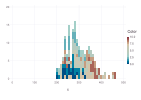

In [6]:
using Gadfly

plot(x = sleep[:Reaction], Geom.histogram(bincount = 30), color = sleep[:Days])

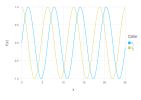

In [11]:
plot([sin, cos], 0, 25)

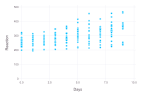

In [8]:
plot(sleep, x = "Days", y = "Reaction", Geom.point)

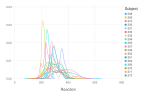

In [10]:
plot(sleep, x = "Reaction", Geom.density, color = "Subject")

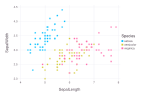

In [12]:
iris = dataset("datasets","iris")

plot(iris, x = "SepalLength", y = "SepalWidth", color = "Species")

In [16]:
autocov(iris[:SepalLength])
autocor(iris[:SepalLength])
crosscov(iris[:SepalLength], iris[:SepalWidth])
crosscor(iris[:SepalLength], iris[:SepalWidth])

45-element Array{Float64,1}:
 -0.288146 
 -0.274176 
 -0.303641 
 -0.261407 
 -0.293696 
 -0.323238 
 -0.335063 
 -0.338121 
 -0.331009 
 -0.32262  
 -0.344832 
 -0.397087 
 -0.348162 
  ⋮        
 -0.324103 
 -0.218366 
 -0.145066 
 -0.238112 
 -0.175823 
 -0.241363 
 -0.189387 
 -0.155105 
 -0.100016 
 -0.0943649
 -0.10896  
 -0.083071 

-------------------------------
**3 Deep dive into inferential statistics**

> **Inferential statistics**: the basis of evidence and reasoning gained from the sample data that is generalized for the population; considers that there will be some sampling errors, which means the sample that we have drawn from the population may not be perfectly representing the population

> **Distribution fitting**: the fitting of a probability distribution to a series of data to predict the probability of variable phenomena in a certain interval:
* For **symmetrical distributions** tending to have the bell curve, the normal distribution and the logistic distributions are most suited. When the kurtosis is higher, the values are spread far away from the center, and then one can also use Student's t-distribution;
* **Skew distributions to the right** or positive skewness is when the distance of the larger values from the mean is greater than the distance of the smaller values from the mean. In these scenarios, log-normal distribution, and log-logistic distribution are most suited. Also, the exponential distribution, the Weibull distribution, the Pareto distribution, and the Gumbel distribution can be suited in some of these scenarios;
* The negative skewness or **skewness to the left** is when the distance of the smaller values from the mean is greater than the distance of the larger values from the mean. For such data, square-normal distribution, Gompertz distribution, and the inverted or mirrored Gumbel distributions are suited.

> **Maximum Likelihood Estimation**: **fit_mle** function using multiple dispatches

> **Maximum-a-Posteriori**: **fit_map** function

> **Z-score** refers to the standard deviations the element is away from the mean: **zscore** function
$$Z = \frac{X - \mu}{\sigma}$$

> The probability that a **null-hypothesis** will be rejected even if it is proven true is the **p-value**. When there is no difference between two measures, then the hypothesis is said to be a null-hypothesis: **pvalue** function
* using HypothesisTest

In [17]:
using DataFrames
using Distributions
using RDatasets
using Gadfly

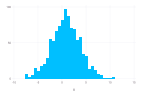

In [46]:
supertype(Normal)
fieldnames(Normal)

srand(619)
dist1 = Normal(1.0, 3.0)

# return a tuple of parameters
params(dist1)
dist1.μ
dist1.σ

# return the probability of success or failure
dist2 = Bernoulli(0.3)
succprob(dist2)
failprob(dist2)

# returns the degree of freedom
dist3 = Chisq(3)
dof(dist3)

# return the number of categories
dist4 = Categorical([0.1, 0.3, 0.6])
ncategories(dist4)

# return the number of trials
dist5 = Binomial(10, 0.3)
ntrials(dist5)
succprob(dist5)

x = rand(dist1, 1000)
plot(x = x, Geom.histogram(bincount = 30))

In [29]:
fit(Normal, x)

Distributions.Normal{Float64}(μ=0.8078616735459642, σ=2.979657403668564)

In [51]:
# sufficient statistics
gensuffstats = suffstats(MultivariateNormal, randn(100,100))
fit_mle(MultivariateNormal, gensuffstats)

FullNormal(
dim: 100
μ: [-0.13857,-0.122383,-0.0962379,0.051819,0.0253464,-0.103427,0.164107,-0.0482964,0.157861,0.0768512  …  -0.0210301,0.0572757,-0.0408697,-0.107102,0.060731,0.0893279,-0.0226483,0.223463,0.0582651,-0.14254]
Σ: [0.791373 -0.0295437 … 0.199935 -0.0656362; -0.0295437 0.739873 … -0.0925267 -0.0782324; … ; 0.199935 -0.0925267 … 0.993345 -0.0492881; -0.0656362 -0.0782324 … -0.0492881 0.97039]
)


-------------------------------
**4 Data visualization**

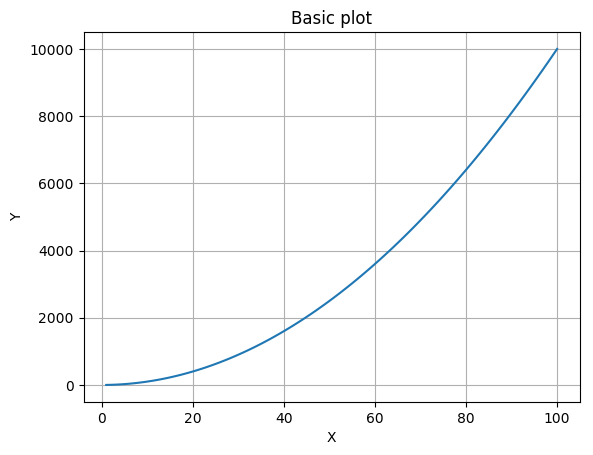

In [79]:
using PyPlot      # or importall PyPlot

# Scalable Vector Graphics (SVG) is an XML-based markup language 
# for a vector image format for two-dimensional graphics with interactivity and animation
PyPlot.svg(true)  # svg(true)

x = [i for i = 1:100]
y = [i^2 for i in x]
p = PyPlot.plot(x, y)
xlabel("X")
ylabel("Y")
PyPlot.title("Basic plot")
grid("on")

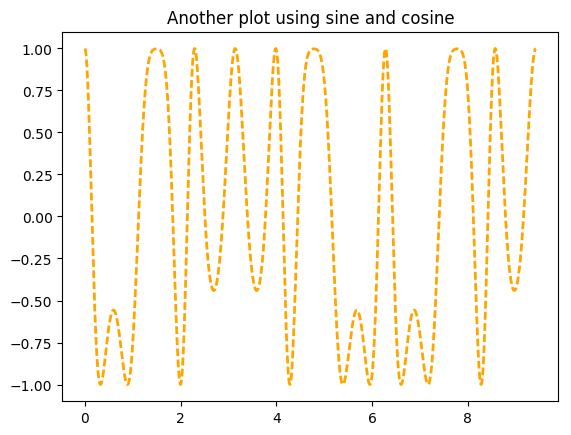

PyObject <matplotlib.text.Text object at 0x322a1ce10>

In [82]:
x = linspace(0, 3pi, 1000)
y = cos(2*x + 3*sin(3*x))
PyPlot.plot(x, y, color="orange", linewidth=2.0, linestyle="--")
PyPlot.title("Another plot using sine and cosine")

In [3]:
using Gadfly

# needed by PNG, PostScript, and PDF
using Cairo
using Fontconfig

exampleplot = plot(x = rand(100), y = rand(100))

draw(SVG("plotinFile1.svg", 4inch, 4inch), exampleplot)
draw(SVGJS("plotinFile1_1.svg", 4inch, 4inch), exampleplot)  # with embeded JavaScript

draw(PNG("plotinFile2.png", 4inch, 4inch), exampleplot)
draw(PS("plotinFile3.ps", 4inch, 4inch), exampleplot)
draw(PDF("plotinFile4.pdf", 4inch, 4inch), exampleplot)

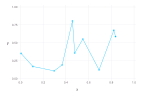

In [98]:
plot(x = rand(10), y = rand(10), Geom.point, Geom.line)

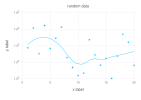

In [102]:
plot(x = 1:20, y = 3.^rand(20),
    Scale.y_sqrt,
    Geom.point, Geom.smooth,
    Guide.xlabel("x label"), Guide.ylabel("y label"), Guide.title("random data"))

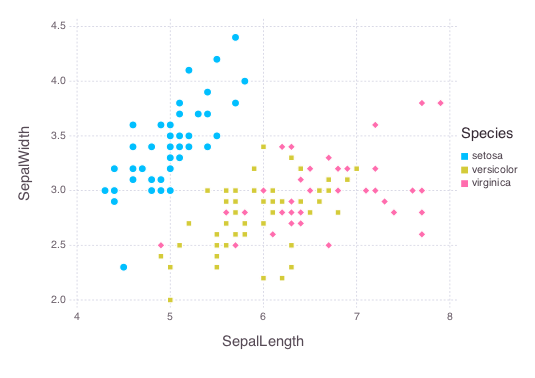

In [11]:
using RDatasets, Gadfly

iris = dataset("datasets", "iris")

plot(iris, x = :SepalLength, y = :SepalWidth, 
    color = :Species, shape = :Species, Geom.point, Theme(point_size = 3pt))

> Arguments of histogram are:
* position: There are two options, :stack or :dodge. This defines if the bars should be placed side by side or stacked on top of each other.
* density: Optional.
* orientation: Horizontal or vertical.
* bincount: The number of bins.
* maxbincount and minbincount: Upper and lower limits when the bin count is automatically chosen.

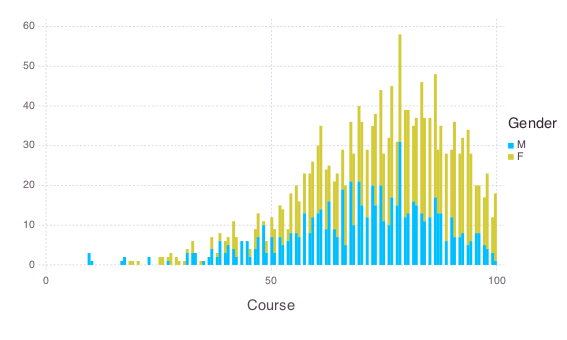

In [41]:
Gcsemv = dataset("mlmRev", "Gcsemv")

plot(Gcsemv, x = :Course, color = :Gender, Geom.histogram)

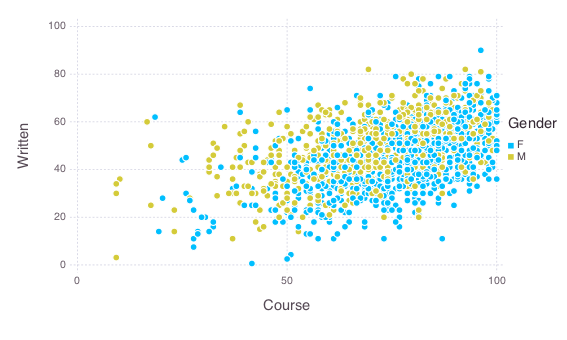

In [22]:
set_default_plot_size(15cm, 9cm)
mlmf = dataset("mlmRev", "Gcsemv")
df = mlmf[completecases(mlmf), :]  # delete all rows including NA
names(df)
plot(df, x = :Course, y = :Written, color = :Gender)

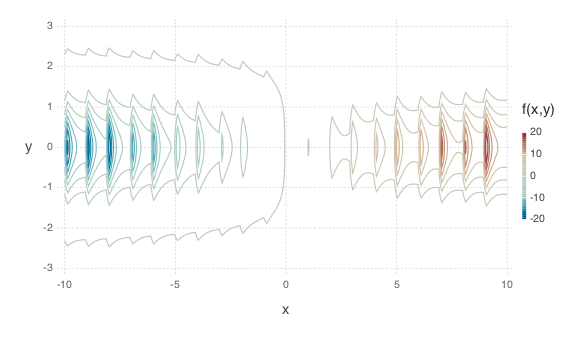

In [26]:
plot((x, y) -> x * exp(-(x - convert(Int64, ceil(x)))^3 - y^2), -10., 10, -3., 3 )

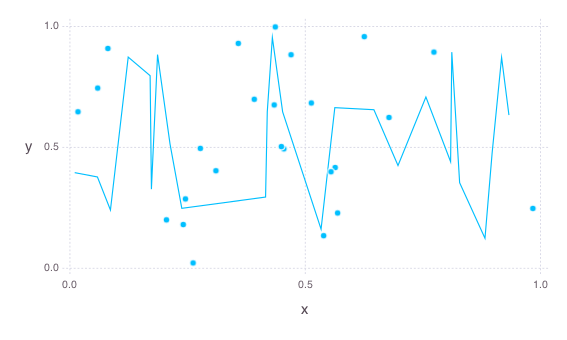

In [28]:
plot(layer(x = rand(25), y = rand(25), Geom.point),
    layer(x = rand(25), y = rand(25), Geom.line))

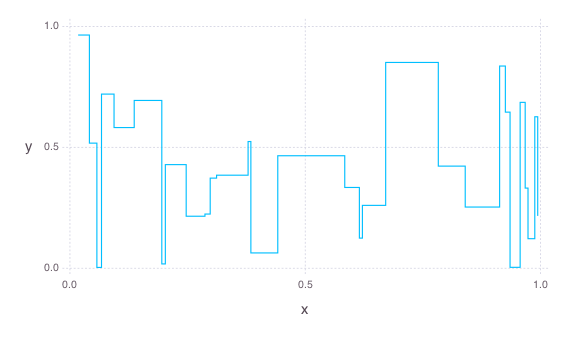

In [31]:
plot(x = rand(30), y = rand(30), Stat.step, Geom.line)

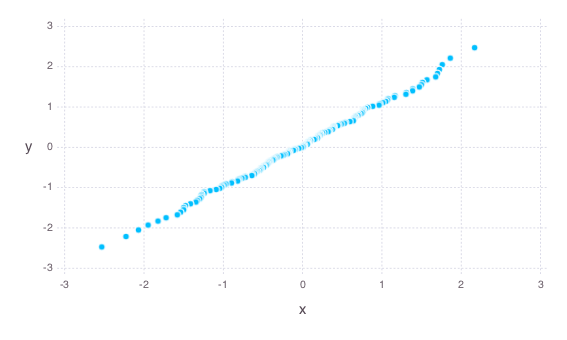

In [33]:
# quantile-quantile function
using Distributions
plot(x = rand(Normal(), 150), y = rand(Normal(), 150), Stat.qq, Geom.point)

plot(x = rand(Normal(), 150), y = Normal(), Stat.qq, Geom.point)  # the same output

> Ticks are used to encompass the data between the axes

> Arguments taken by the ticks function are:
* ticks: A specific array of ticks (they are computed when nothing is there) 
* granularity_weight: Number of ticks (default is 1/4) 
* simplicity_weight: Include zero (default is 1/6)
* coverage_weight: Tightly fit the span of the data (default is 1/3) 
* niceness_weight: Numbering (default is 1/4)

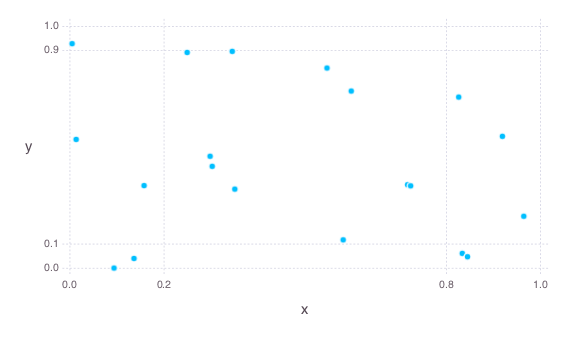

In [34]:
plot(x = rand(20), y = rand(20), 
    Stat.xticks(ticks = [0.0, 0.2, 0.8, 1.0]),
    Stat.yticks(ticks = [0.0, 0.1, 0.9, 1.0]), 
    Geom.point)

> Boxplots
* The first and third quartiles are represented by the bottom and top of the box 
* The band inside the box is the second quartile (median)
* The bands outside the box are minimum and maximum

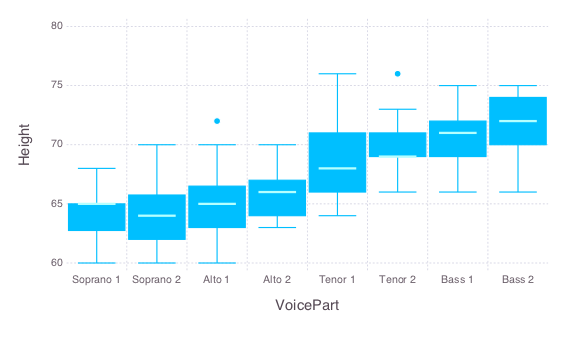

In [35]:
using RDatasets

singer = dataset("lattice", "singer")
plot(singer, x = :VoicePart, y = :Height, Geom.boxplot)

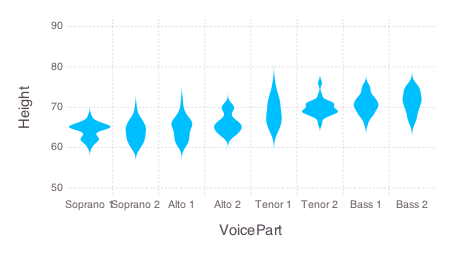

In [72]:
# used to show the density
singer = dataset("lattice", "singer")
plot(singer, x = :VoicePart, y = :Height, Geom.violin)

> Arguments of Beeswarm are:
* orientation: This can be :vertical or :horizontal
* padding: The minimum distance between two points

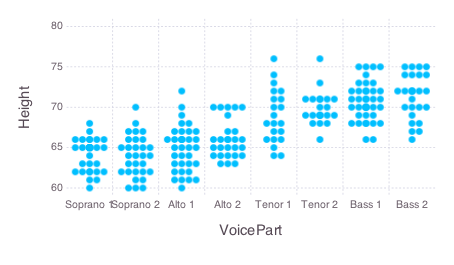

In [73]:
# also used to represent density
singer = dataset("lattice", "singer")
plot(singer, x = :VoicePart, y = :Height, Geom.beeswarm)

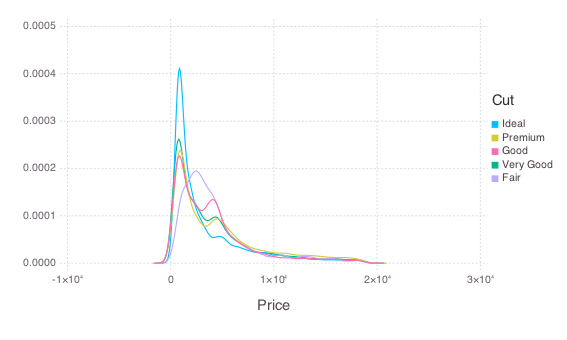

In [36]:
diamonds = dataset("ggplot2", "diamonds")
plot(diamonds, x = :Price, color = :Cut, Geom.density)

> x_continuous and y_continuous
* These are used to map values to x and y coordinates. 

> Aesthetics are:
* x, xmin/xmax, and xintercept y, ymin/ymax, and yintercept

> Arguments are:
* minvalue: Minimum x or y value
* maxvalue: Maximum x or y value
* labels: This can be either a function or nothing

> When a function is passed, a string is mapped to the value in x or y 
* format: Formatting of the numbers

> Variations are:
* Scale.x_continuous and Scale.y_continuous
* Scale.x_log10 and Scale.ylog10 
* Scale.x_log2 and Scale.ylog2
* Scale.x_log and Scale.y_log 
* Scale.x_asinh and Scale.y_asinh 
*Scale.x_sqrt and Scale.y_sqrt

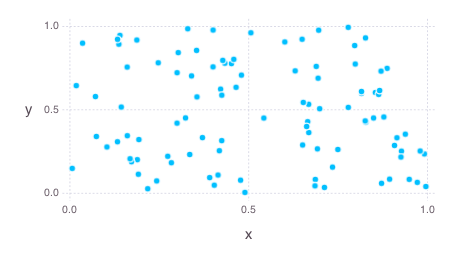

In [76]:
plot(x = rand(100), y = rand(100), Scale.x_continuous, Scale.y_continuous)

> x_discrete and y_discrete
* These are used to map the categorical data to the Cartesian coordinates. Regardless of the value, each value is mapped to a point.

> Aesthetics are:
* x, xmin/xmax, and xintercept
* y, ymin/ymax, and yintercept

> Arguments are:
* labels: This can be either a function or nothing

> When a function is passed, a string is mapped to the value in x or y:

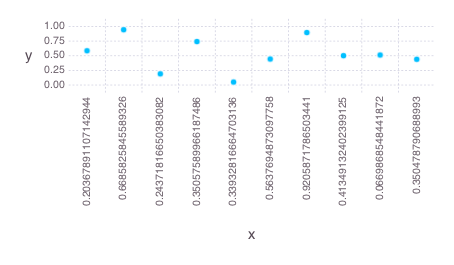

In [78]:
plot(x = rand(10), y = rand(10),
    Scale.x_discrete)

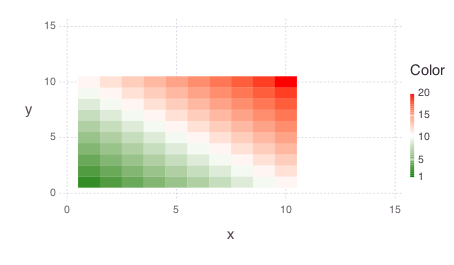

In [82]:
x = repeat(1:10, inner = 10)
y = repeat(1:10, outer = 10)

plot(x = x, y = y, 
    color = x + y,
    Geom.rectbin, 
    Scale.ContinuousColorScale(Scale.lab_gradient(colorant"green", 
                                                colorant"white",
                                                colorant"red")))

> Arguments of bar are:
* position: This can be :stack or :dodge
* orientation: This can be :vertical or :horizontal

> If :horizontal is chosen, then it is required to provide y as an aesthetic (or ymin/ymax).

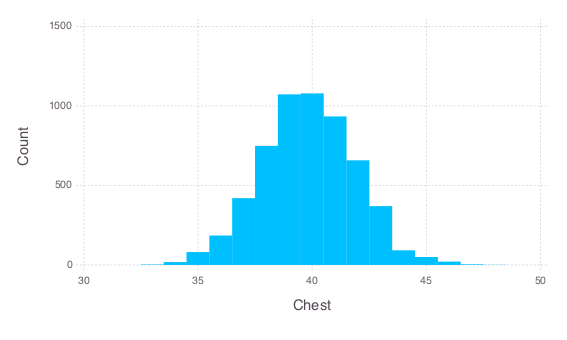

In [43]:
ChestStat = dataset("HistData", "ChestSizes")
plot(ChestStat, x = :Chest, y = :Count, Geom.bar)

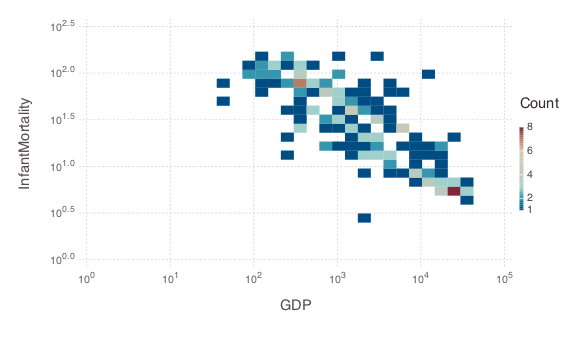

In [46]:
UN_data = dataset("car", "UN")
plot(UN_data, x = :GDP, y = :InfantMortality, 
    Scale.x_log10, Scale.y_log10, Geom.histogram2d(xbincount = 20, ybincount = 20))

> Arguments of smooth line plot are:
* smoothing: This specifies to what extent smoothing should be done

> Smaller values use more data (more fit) and larger values use less data (less fit).
* Method: The :lm and :loess methods are supported as arguments to generate the smooth curve

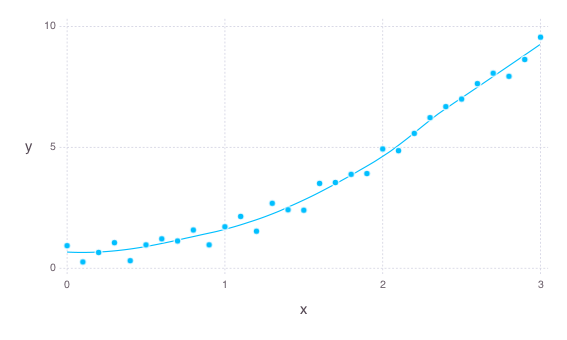

In [49]:
x_data = 0.0 : 0.1 : 3.0
y_data = x_data .^ 2 + rand(length(x_data))

plot(x = x_data, y = y_data, 
    Geom.point, 
    Geom.smooth(method = :loess, smoothing = 0.5))

> Aesthetics of subplot grid are:
* xgroup and ygroup (optional): Use these to arrange the subplots on the x axis or y axis on the basis of the categorical data
* free_y_axis and free_x_axis (optional): By default, the values are false, which means the y axis or x axis scales can differ across different subplots

> If the value is true, then scales are set for individual plots 
* If both xgroup and ygroup are bound, then a grid is formed

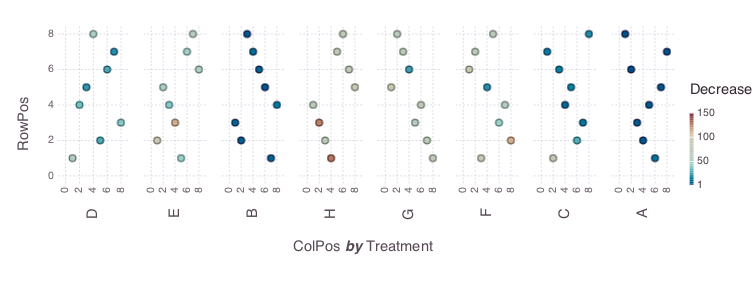

In [59]:
set_default_plot_size(20cm, 7.5cm)
Sprays = dataset("datasets", "OrchardSprays")

plot(Sprays, x = :ColPos, y = :RowPos, 
    xgroup = :Treatment, color = :Decrease, 
    Geom.subplot_grid(Geom.point))

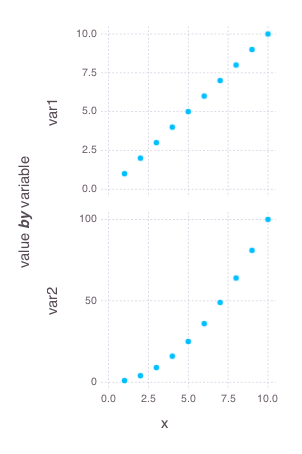

In [61]:
using DataFrames

set_default_plot_size(8cm, 12cm)
wide_df = DataFrame(x = 1:10, var1 = 1:10, var2 = [i.^2 for i = 1:10])
long_df = stack(wide_df, [:var1, :var2])

plot(long_df, x = :x, y = :value, 
    ygroup = :variable, 
    Geom.subplot_grid(Geom.point, free_y_axis = true))

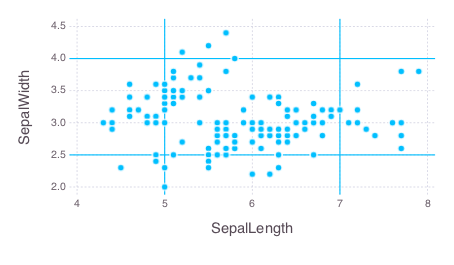

In [65]:
set_default_plot_size(12cm, 7.0cm)
plot(dataset("datasets", "iris"), 
    x = :SepalLength, y = :SepalWidth, 
    xintercept = [5.0, 7.0], Geom.point, Geom.vline, 
    yintercept = [2.5, 4.0], Geom.point, Geom.hline)

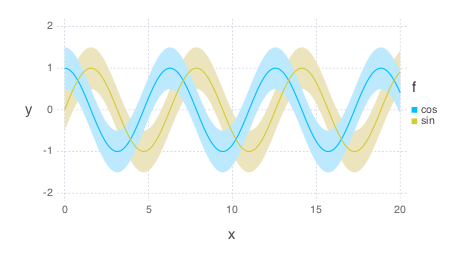

In [71]:
xs = 0.0 : 0.1 : 20.0
cos_df = DataFrame(x = xs, y = cos(xs), ymin = cos(xs) .- 0.5, ymax = cos(xs) .+ 0.5, f = :cos)
sin_df = DataFrame(x = xs, y = sin(xs), ymin = sin(xs) .- 0.5, ymax = sin(xs) .+ 0.5, f = :sin)

df = vcat(cos_df, sin_df)

plot(df, x = :x, y = :y, ymin = :ymin, ymax = :ymax, 
    color = :f, Geom.line, Geom.ribbon)

-------------------------------
# Machine Learning
-------------------------------
> A computer program is said to learn from experience E with respect to some class of tasks T and performance measure P if its performance at tasks in T, as measured by P, improves with experience E --Tom M. Mitchell

> Some basic terminologies:
* **Features**: distinctive characteristics of the data point or record
* **Traing set**: this is the dataset that we feed to train the algorithm that helps us to find relationships or build a model
* **Testing set**: the algorithm generated using the training dataset is tested on the testing dataset to find the accuracy
* **Feature vector**: an n-dimensional vector that contains the features defining an object
* **Sample**: an item from the dataset or the record

> Uses:
* E-mail spam filtering
* Predicting storms and natural disasters
* Targeted promotions/campaigns and advertising
* Self-driving cars
* predicting the market
* predicting the outcomes of elections and the sentiment of voters towards a particular candidate
* preventing crime

> Categories:
* Supervised learning
* Unsupervised learning
* Reinforcement learning
* Transfer learning

-------------------------------
**5 Supervised Learning**

> Decision trees: **ID3**(Iterative Dichotomiser 3), **C4.5/C5.0**
* a very good example of "divide and conquer"
* used for inductive inference
* can be used for both classification and regression
* non-parametric
* applications: decision of credit card/loan approval, medical diagnosis 

> Entropy measures
* Purity: the measure of a node containg only one class
* Purity in C5.0 is measured using entropy, here c denotes class level
$$Entropy(S) = \sum_{i=1}^c -p_i log_2(p_i)$$
* Information gain: F denotes feature, $S_1$,$S_2$ denote the split of dataset S
$$InfoGain(F) = Entropy(S_1) - Entropy(S_2)$$

> Naive Bayes:
* every pair of features is independent of one another
* based on Bayes' theorem
$$P(A|B) = \frac{P(B|A) P(A)}{P(B)}$$
* effective in avoiding **false positive**
* applications: text classification; spam filtering(bag-of-words); recommender systems

> Random forests: based on CART
* using RandomForests

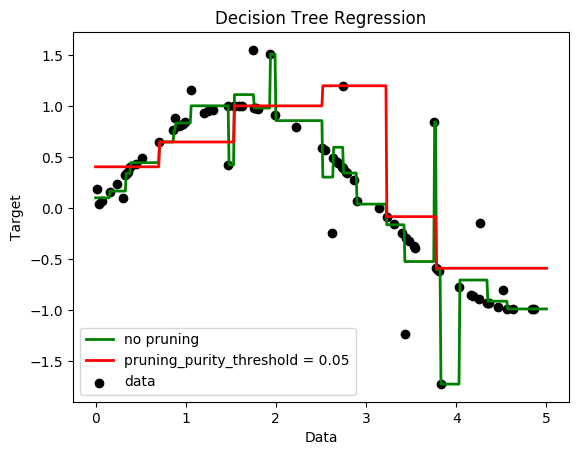

PyObject <matplotlib.legend.Legend object at 0x3278b1e50>

In [15]:
using DecisionTree
using ScikitLearn
using PyPlot

# create a random dataset
srand(100)
x = sort(5 * rand(80))
xx = reshape(x, 80, 1)
y = sin(x)
y[1:5:end] += 3 * (0.5 - rand(16))

# fit regression model
regr_1 = DecisionTreeRegressor()
regr_2 = DecisionTreeRegressor(pruning_purity_threshold = 0.05)

fit!(regr_1, xx, y)
fit!(regr_2, xx, y)

# predict
x_test = 0.0 : 0.01 : 5.0
y_1 = predict(regr_1, hcat(x_test))
y_2 = predict(regr_2, hcat(x_test))

# plot the results
scatter(x, y, c = "k", label = "data")
plot(x_test, y_1, c = "g", label = "no pruning", linewidth = 2)
plot(x_test, y_2, c = "r", label = "pruning_purity_threshold = 0.05", linewidth = 2)

xlabel("Data")
ylabel("Target")
title("Decision Tree Regression")
legend(prop = Dict("size" => 10))

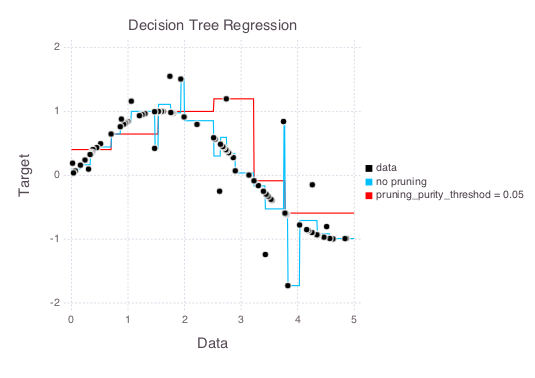

In [21]:
using DecisionTree
using ScikitLearn
using Gadfly

# create a random dataset
srand(100)
x = sort(5 * rand(80))
xx = reshape(x, 80, 1)
y = sin(x)
y[1:5:end] += 3 * (0.5 - rand(16))

# fit regression model
regr_1 = DecisionTreeRegressor()
regr_2 = DecisionTreeRegressor(pruning_purity_threshold = 0.05)

fit!(regr_1, xx, y)
fit!(regr_2, xx, y)

# predict
x_test = 0.0 : 0.01 : 5.0
y_1 = predict(regr_1, hcat(x_test))
y_2 = predict(regr_2, hcat(x_test))


plot(layer(x = x, y = y, Geom.point, Theme(default_color = "black")), 
    layer(x = x_test, y = y_1, Geom.line, Theme(default_color = "deepskyblue")), 
    layer(x = x_test, y = y_2, Geom.line, Theme(default_color = "red")), 
    Guide.manual_color_key("", ["data", "no pruning", "pruning_purity_threshod = 0.05"], ["black", "deepskyblue", "red"]), 
    Guide.xlabel("Data"), Guide.ylabel("Target"),
    Guide.title("Decision Tree Regression"))


In [1]:
# dummy dataset
using NaiveBayes

x = [1 1 0 2 1;
    0 0 3 1 0;
    1 0 1 0 2]
y = [:a, :b, :b, :a, :a]

m = MultinomialNB(unique(y), 3)
fit(m, x, y)

x_test = [0 4 1;
        2 2 0;
        1 1 1]
NaiveBayes.predict(m, x_test)

3-element Array{Symbol,1}:
 :b
 :a
 :a

In [13]:
#actual dataset
using NaiveBayes
using RDatasets

iris = dataset("datasets", "iris")

# arrays for the feature vectors
#x = iris[:, 1:4]
#x = Array(x)'
x = convert(Array, iris[:, 1:4])'

p, n = size(x)

y = [species for species in iris[:, 5]]

# how much data use for training
train_frac = 0.9
k = convert(Int64, floor(train_frac * n))  # floor(Int, train_frac * n)
idxs = randperm(n)
train = idxs[1:k]
test = idxs[k+1:end]

model = GaussianNB(unique(y), p)
fit(model, x[:, train], y[train])

accuracy = countnz(predict(model, x[:,test]) .== y[test]) / countnz(test)
println("Accuracy: $accuracy")

Accuracy: 1.0


**6 Unsupervised Learning**
> Used extensively in finding similar users, recommender systems, text classification, and so on

> Clustering: a technique to divide data into groups (clusters) that are useful and meaningful
* applications: biology, marketing, weather/climate, pattern recognition, information retrieval, and so on

> Types of clustering:
* Nested? hierarchical/partitional
* Overlapping, exclusive, fuzzy
* Partial/complete

> Types of cluster:
* non-spherical/circular in shape
* clusters of different sizes
* clusters of different densities

> Algorithms:
* K-Means/K-medoid: Manhattan(L1) distance, Squared Euclidean(L2^2), Cosine, Bregman divergence
* Bisecting K-means
* Hierarchical clustering: agglomerative vs divisive clustering
* DBSCAN (Density-based Spatial Clustering of Applications with Noise)

INFO: Recompiling stale cache file /Users/brucelee/.julia/lib/v0.5/Gadfly.ji for module Gadfly.


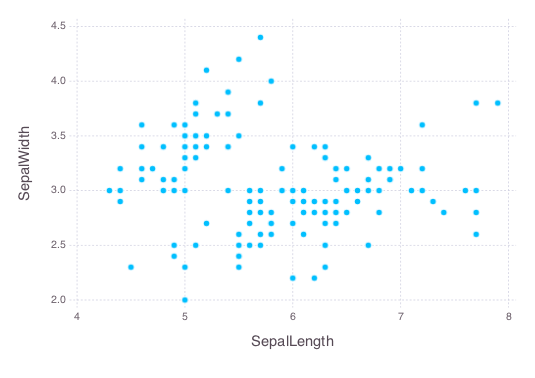

In [14]:
using Clustering
using Gadfly
using RDatasets

iris = dataset("datasets", "iris")

plot(iris, 
    x = :SepalLength, y = :SepalWidth, 
    Geom.point)

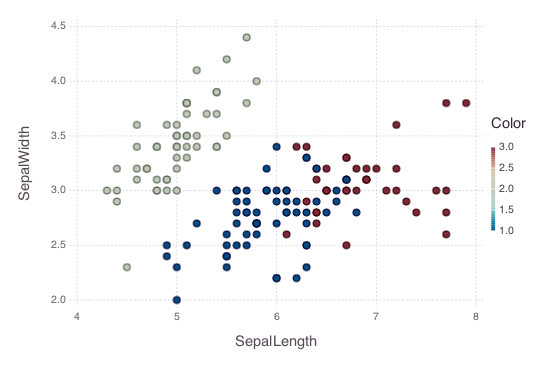

In [15]:
features = convert(Array, iris[:, 1:4])'

result = kmeans(features, 3)

plot(iris, 
    x = :SepalLength, y = :SepalWidth, 
    color = result.assignments, 
    Geom.point)

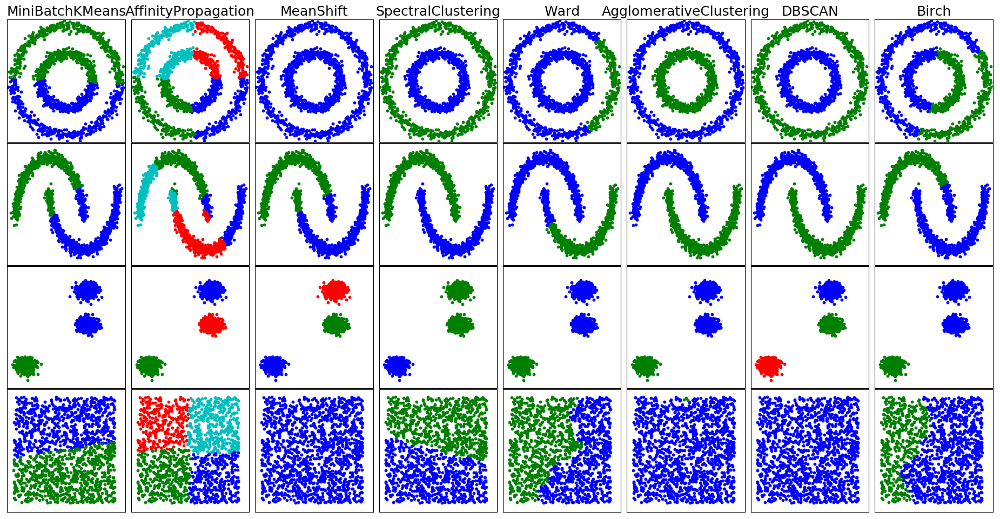

/Users/brucelee/.julia/v0.5/Conda/deps/usr/lib/python2.7/site-packages/sklearn/manifold/spectral_embedding_.py:229: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"
/Users/brucelee/.julia/v0.5/Conda/deps/usr/lib/python2.7/site-packages/sklearn/cluster/hierarchical.py:193: UserWarning: the number of connected components of the connectivity matrix is 2 > 1. Completing it to avoid stopping the tree early.
  connectivity, n_components = _fix_connectivity(X, connectivity)
/Users/brucelee/.julia/v0.5/Conda/deps/usr/lib/python2.7/site-packages/sklearn/cluster/hierarchical.py:418: UserWarning: the number of connected components of the connectivity matrix is 2 > 1. Completing it to avoid stopping the tree early.
  connectivity, n_components = _fix_connectivity(X, connectivity)
/Users/brucelee/.julia/v0.5/Conda/deps/usr/lib/python2.7/site-packages/sklearn/cluster/hierarchical.py:193: UserWar

In [23]:
using ScikitLearn
using PyPlot

# the scikit-learn library in our Python environment is required
# $ conda install scikit-learn

# imports models from the Python version of scikit-learn
@sk_import datasets: (make_circles, make_moons, make_blobs)
@sk_import cluster: (estimate_bandwidth, MeanShift, MiniBatchKMeans, AgglomerativeClustering, SpectralClustering)
@sk_import cluster: (DBSCAN, AffinityPropagation, Birch)
@sk_import preprocessing: StandardScaler
@sk_import neighbors: kneighbors_graph

srand(30)

#generate datasets
n_samples = 1500
noisy_circles = make_circles(n_samples = n_samples, factor = .5, noise = .05)
noisy_moons = make_moons(n_samples = n_samples, noise = .05)
blobs = make_blobs(n_samples = n_samples, random_state = 8)
no_structure = rand(n_samples, 2), nothing

colors0 = collect("bgrcmykbgrcmykbgrcmykbgrcmyk")
colors = vcat(fill(colors0, 20)...)
clustering_names = ["MiniBatchKMeans", "AffinityPropagation", "MeanShift", "SpectralClustering", 
    "Ward", "AgglomerativeClustering", "DBSCAN", "Birch"]

figure(figsize = (length(clustering_names) * 2 +3, 9.5))
subplots_adjust(left = .02, right = .98, bottom = .001, top = .96, wspace = .05, hspace = .01)
plot_num = 1
datasets = [noisy_circles, noisy_moons, blobs, no_structure]

for (i_dataset, dataset) in enumerate(datasets)
    x, y = dataset
    # normalization
    x = fit_transform!(StandardScaler(), x)
    
    # estimate bandwidth for mean shift
    bandwidth = estimate_bandwidth(x, quantile = 0.3)
    # connectivity matrix for structured Ward
    connectivity = kneighbors_graph(x, n_neighbors = 10, include_self = false)[:todense]()
    #PyCall does not support numpy sparse matrices, make connectivity symmetric
    connectivity = 0.5 * (connectivity + connectivity')
    
    #create clustering estimators
    ms = MeanShift(bandwidth = bandwidth, bin_seeding = true)
    two_means = MiniBatchKMeans(n_clusters = 2)
    ward = AgglomerativeClustering(n_clusters = 2, linkage = "ward", connectivity = connectivity)
    spectral = SpectralClustering(n_clusters = 2, eigen_solver = "arpack", affinity = "nearest_neighbors")
    dbscan = DBSCAN(eps = .2)
    affinity_propagation = AffinityPropagation(damping = .9, preference = -200)
    average_linkage = AgglomerativeClustering(linkage = "average", affinity = "cityblock",
        n_clusters = 2, connectivity = connectivity)
    birch = Birch(n_clusters = 2)
    clustering_algorithms = [two_means, affinity_propagation, ms, spectral, ward, average_linkage, dbscan, birch]
    
    for (name, algorithm) in zip(clustering_names, clustering_algorithms)
        ScikitLearn.fit!(algorithm, x)
        y_pred = nothing
        try
            y_pred = ScikitLearn.predict(algorithm, x)
        catch e
            if isa(e, KeyError)
                y_pred = map(Int, algorithm[:labels_])
                clamp!(y_pred, 0, 27)
            else
                rethrow()
            end
        end
        subplot(4, length(clustering_algorithms), plot_num)
        if i_dataset == 1
            PyPlot.title(name, size = 18)
        end
        for y_val in unique(y_pred)
            selected = y_pred .==y_val
            scatter(x[selected, 1], x[selected, 2], color = string(colors0[y_val + 1]), s = 10)
        end
        
        xlim(-2, 2)
        ylim(-2, 2)
        xticks(())
        yticks(())
        plot_num += 1
    end
end

**7 Ensemble Methods**
> A group of people have the ability to take better decisions than a single individual, especially when each group member comes in with their own biases. The ideology is also true for machine learning

> learner: unstable if the output clssifier has to undergo radical changes when there are some small variations in the training data
* unstable learner: decision trees, neural networks (ensemble learning is more suited for the unstable learners)
* stable learner: nearest neighbor, linear regression

> subsampling:
* bagging: also known as Bootstrap aggregation, used in **Random forest**(Leo Breiman, Adele Cutler; Strata 2012; Dietterich)
* boosting: base on the PAC(Probably Approximately Correct) framework

> AdaBoost(Adaptive Boosting) algorithm
* the strength derives from the adaptive resampling of examples, not from the final weighted combination

> Manipulating the input features: image processing, PCA

>Injecting randomness:
* Neural networks with backpropagation are also created using the same technique for hidden weights

> Applications:
* Optical character recognition
* Text categorization
* Face recognition
* Computer-aided medical diagnosis

In [33]:
using RandomForests
using RDatasets

# classification
iris = dataset("datasets", "iris")
rf = RandomForestClassifier(n_estimators = 100, max_features = :sqrt)
RandomForests.fit(rf, iris[1:4], iris[:Species])
@show RandomForests.predict(rf, iris[1:4])
# out-of-bag
@show RandomForests.oob_error(rf)
@show RandomForests.feature_importances(rf)

# regression
boston = dataset("MASS", "boston")
rf = RandomForestRegressor(n_estimators = 5)
RandomForests.fit(rf, boston[1:13], boston[:MedV])
@show RandomForests.predict(rf, boston[1:13])

RandomForests.predict(rf,iris[1:4]) = String["setosa","setosa","setosa","setosa","setosa","setosa","setosa","setosa","setosa","setosa","setosa","setosa","setosa","setosa","setosa","setosa","setosa","setosa","setosa","setosa","setosa","setosa","setosa","setosa","setosa","setosa","setosa","setosa","setosa","setosa","setosa","setosa","setosa","setosa","setosa","setosa","setosa","setosa","setosa","setosa","setosa","setosa","setosa","setosa","setosa","setosa","setosa","setosa","setosa","setosa","versicolor","versicolor","versicolor","versicolor","versicolor","versicolor","versicolor","versicolor","versicolor","versicolor","versicolor","versicolor","versicolor","versicolor","versicolor","versicolor","versicolor","versicolor","versicolor","versicolor","versicolor","versicolor","versicolor","versicolor","versicolor","versicolor","versicolor","versicolor","versicolor","versicolor","versicolor","versicolor","versicolor","versicolor","versicolor","versicolor","versicolor","versicolor","versicolor

506-element Array{Float64,1}:
 23.76
 21.6 
 34.84
 33.4 
 34.36
 26.18
 22.56
 22.8 
 17.48
 19.84
 20.62
 19.74
 21.86
  ⋮   
 23.84
 21.18
 17.66
 18.3 
 22.62
 17.7 
 18.56
 22.12
 17.32
 23.9 
 20.36
 14.3 

In [3]:
using DecisionTree
using RDatasets

iris = dataset("datasets", "iris")
features = convert(Array, iris[:, 1:4])
labels = convert(Array, iris[:, 5])

# train full-tree classifier
model = build_tree(labels, features)
# prune tree: merge leaves having >= 90% combined purity (default: 100%)
model = prune_tree(model, 0.9)
# pretty print of the tree, to a depth of 5 nodes (optional)
print_tree(model, 5)

Feature 3, Threshold 3.0
L-> setosa : 50/50
R-> Feature 4, Threshold 1.8
    L-> Feature 3, Threshold 5.0
        L-> versicolor : 47/48
        R-> Feature 4, Threshold 1.6
            L-> virginica : 3/3
            R-> Feature 1, Threshold 7.2
                L-> versicolor : 2/2
                R-> virginica : 1/1
    R-> Feature 3, Threshold 4.9
        L-> Feature 1, Threshold 6.0
            L-> versicolor : 1/1
            R-> virginica : 2/2
        R-> virginica : 43/43


In [4]:
# apply learned model
apply_tree(model, [5.9,3.0,5.1,1.9])
# get the probability of each label
apply_tree_proba(model, [5.9,3.0,5.1,1.9], ["setosa", "versicolor", "virginica"])
# run n-fold cross validation for pruned tree,
# using 90% purity threshold pruning, and 3 CV folds
accuracy = nfoldCV_tree(labels, features, 0.9, 3)


Fold 1
Classes:  

3×3 Array{Int64,2}:
 10   0   0
  0  14   3
  0   2  21

Any["setosa","versicolor","virginica"]
Matrix:   

3×3 Array{Int64,2}:
 24   0   0
  1  12   0
  0   0  13

3×3 Array{Int64,2}:
 16   0   0
  0  19   1
  0   0  14


Accuracy: 0.9
Kappa:    0.8413705583756343

Fold 2
Classes:  Any["setosa","versicolor","virginica"]
Matrix:   
Accuracy: 0.98
Kappa:    0.9682539682539683

Fold 3
Classes:  Any["setosa","versicolor","virginica"]
Matrix:   
Accuracy: 0.98
Kappa:    0.9697702539298669

Mean Accuracy: 0.9533333333333333


3-element Array{Float64,1}:
 0.9 
 0.98
 0.98

In [5]:
# train random forest classifier
# using 2 random features, 10 trees, 0.5 portion of samples per tree (optional), and a maximum tree depth of 6 (optional)
model = build_forest(labels, features, 2, 10, 0.5, 6)

Ensemble of Decision Trees
Trees:      10
Avg Leaves: 6.1
Avg Depth:  4.1

In [6]:
# apply learned model
apply_forest(model, [5.9,3.0,5.1,1.9])
# get the probability of each label
apply_forest_proba(model, [5.9,3.0,5.1,1.9], ["setosa", "versicolor", "virginica"])
# run n-fold cross validation for forests
# using 2 random features, 10 trees, 3 folds and 0.5 of samples per tree (optional)
accuracy = nfoldCV_forest(labels, features, 2, 10, 3, 0.5)

3×3 Array{Int64,2}:
 13   0   0
  0  18   1
  0   1  17

3×3 Array{Int64,2}:
 19   0   0
  0  14   1
  0   1  15

3×3 Array{Int64,2}:
 18   0   0
  3  12   1
  0   0  16


Fold 1
Classes:  Any["setosa","versicolor","virginica"]
Matrix:   
Accuracy: 0.96
Kappa:    0.9392466585662211

Fold 2
Classes:  Any["setosa","versicolor","virginica"]
Matrix:   
Accuracy: 0.96
Kappa:    0.9396863691194209

Fold 3
Classes:  Any["setosa","versicolor","virginica"]
Matrix:   
Accuracy: 0.92
Kappa:    0.879372738238842

Mean Accuracy: 0.9466666666666667


3-element Array{Float64,1}:
 0.96
 0.96
 0.92

In [7]:
n, m = 10^3, 5
features = randn(n, m)
weights = rand(-2:2, m)
labels = features * weights
# train regression tree, using an averaging of 5 samples per leaf (optional)
model = build_tree(labels, features, 5)
apply_tree(model, [-0.9,3.0,5.1,1.9,0.0])
# run n-fold cross validation, using 3 folds, averaging of 5 samples per leaf (optional)
# returns array of coefficients of determination (R^2)
r2 = nfoldCV_tree(labels, features, 3, 5)


Fold 1
Mean Squared Error:     3.725269174216577
Correlation Coeff:      0.8699153994950046
Coeff of Determination: 0.7409715674216157

Fold 2
Mean Squared Error:     2.9382603167951724
Correlation Coeff:      0.8868264655316773
Coeff of Determination: 0.7818406132035786

Fold 3
Mean Squared Error:     4.048893304984978
Correlation Coeff:      0.8503101719531742
Coeff of Determination: 0.7134996315717189

Mean Coeff of Determination: 0.7454372707323045


3-element Array{Float64,1}:
 0.740972
 0.781841
 0.7135  

In [8]:
# train regression forest, using 2 random features, 10 trees,
# averaging of 5 samples per leaf (optional), 0.7 of samples per tree (optional)
model = build_forest(labels,features, 2, 10, 5, 0.7)
# apply learned model
apply_forest(model, [-0.9,3.0,5.1,1.9,0.0])
# run n-fold cross validation on regression forest
# using 2 random features, 10 trees, 3 folds, averaging of 5 samples/leaf (optional),
# and 0.7 porition of samples per tree (optional)
# returns array of coefficients of determination (R^2)
r2 = nfoldCV_forest(labels, features, 2, 10, 3, 5, 0.7)


Fold 1
Mean Squared Error:     1.5722845200873194
Correlation Coeff:      0.9526701478812282
Coeff of Determination: 0.8865432523485574

Fold 2
Mean Squared Error:     1.735784994594359
Correlation Coeff:      0.9483640009167486
Coeff of Determination: 0.8730866521673614

Fold 3
Mean Squared Error:     2.076605469776979
Correlation Coeff:      0.9416462052982908
Coeff of Determination: 0.8564291477835029

Mean Coeff of Determination: 0.8720196840998072


3-element Array{Float64,1}:
 0.886543
 0.873087
 0.856429

**8 Time Series**
> Forecasting

> Decision-making process

> Time series: an arrangement of insights, typically gathered at standard intervals
* Economics: monthly data for unemployment, hospital admissions
* Finance: daily exchange rate, a share price
* Environmental: daily rainfall, air quality readings
* Medicine: ECG brain wave activity every 2 to 8 seconds

> ARIMA(Autoregressive Integrated Moving Average) model

> Autocorrelation correlogram: autocorrelation function(ACF)

In [20]:
using TimeSeries
using MarketData

ohlc[1]
ohlc[1:3]
ohlc[[1:3;9]]
ohlc["Open", "Close"]
ohlc[[Date(2000, 1, 3), Date(2000, 2, 4)]]
ohlc[Date(2000, 1, 3) : Date(2000, 2, 4)]
ohlc["Open"][Date(2000, 1, 10)]

1x1 TimeSeries.TimeArray{Float64,1,Date,Array{Float64,1}} 2000-01-10 to 2000-01-10

             Open      
2000-01-10 | 102       


In [71]:
day(Date(2000, 1, 3))
dayname(Date(2000, 1, 3))
week(Date(2000, 1, 3))
month(Date(2000, 1, 3))
monthname(Date(2000, 1, 3))
year(Date(2000, 1, 3))
dayofweek(Monday)
dayofweekofmonth(Date(2000, 1, 25))
dayofyear(Date(2000, 12, 31))
quarterofyear(Date(2000, 12, 31))
dayofquarter(Date(2000, 12, 31))

93

In [39]:
when(cl, dayofweek, 1)

95x1 TimeSeries.TimeArray{Float64,1,Date,Array{Float64,1}} 2000-01-03 to 2001-12-31

             Close     
2000-01-03 | 111.94    
2000-01-10 | 97.75     
2000-01-24 | 106.25    
2000-01-31 | 103.75    
⋮
2001-12-10 | 22.54     
2001-12-17 | 20.62     
2001-12-24 | 21.36     
2001-12-31 | 21.9      


In [40]:
from(cl, Date(2001, 10, 24))

47x1 TimeSeries.TimeArray{Float64,1,Date,Array{Float64,1}} 2001-10-24 to 2001-12-31

             Close    
2001-10-24 | 18.95    
2001-10-25 | 19.19    
2001-10-26 | 18.67    
2001-10-29 | 17.63    
⋮
2001-12-26 | 21.49    
2001-12-27 | 22.07    
2001-12-28 | 22.43    
2001-12-31 | 21.9     


In [41]:
to(cl, Date(2001, 10, 24))

454x1 TimeSeries.TimeArray{Float64,1,Date,Array{Float64,1}} 2000-01-03 to 2001-10-24

             Close     
2000-01-03 | 111.94    
2000-01-04 | 102.5     
2000-01-05 | 104.0     
2000-01-06 | 95.0      
⋮
2001-10-19 | 18.3      
2001-10-22 | 19.02     
2001-10-23 | 18.14     
2001-10-24 | 18.95     


In [42]:
red = findwhen(ohlc["Close"] .< ohlc["Open"])

252-element Array{Date,1}:
 2000-01-04
 2000-01-06
 2000-01-10
 2000-01-11
 2000-01-12
 2000-01-20
 2000-01-21
 2000-01-24
 2000-01-28
 2000-02-01
 2000-02-02
 2000-02-09
 2000-02-11
 ⋮         
 2001-11-27
 2001-11-28
 2001-11-29
 2001-12-03
 2001-12-06
 2001-12-11
 2001-12-12
 2001-12-13
 2001-12-14
 2001-12-20
 2001-12-21
 2001-12-31

In [43]:
green = find(ohlc["Close"] .> ohlc["Open"])

244-element Array{Int64,1}:
   1
   3
   5
   9
  10
  11
  12
  16
  17
  18
  20
  23
  24
   ⋮
 480
 482
 483
 485
 486
 491
 492
 493
 496
 497
 498
 499

In [45]:
# putting yesterday's value in today's timestamp
cl[1:4]

lag(cl[1:4])

3x1 TimeSeries.TimeArray{Float64,1,Date,Array{Float64,1}} 2000-01-04 to 2000-01-06

             Close     
2000-01-04 | 111.94    
2000-01-05 | 102.5     
2000-01-06 | 104.0     


In [46]:
# opposite to the lag
lead(cl[1:4])

3x1 TimeSeries.TimeArray{Float64,1,Date,Array{Float64,1}} 2000-01-03 to 2000-01-05

             Close     
2000-01-03 | 102.5     
2000-01-04 | 104.0     
2000-01-05 | 95.0      


In [47]:
# lead till that
lead(cl, 400)

100x1 TimeSeries.TimeArray{Float64,1,Date,Array{Float64,1}} 2000-01-03 to 2000-05-24

             Close    
2000-01-03 | 19.5     
2000-01-04 | 19.13    
2000-01-05 | 19.25    
2000-01-06 | 18.9     
⋮
2000-05-19 | 21.49    
2000-05-22 | 22.07    
2000-05-23 | 22.43    
2000-05-24 | 21.9     


In [64]:
update(cl, Date(2002,1,1), 111.11)

501x1 TimeSeries.TimeArray{Float64,1,Date,Array{Float64,1}} 2000-01-03 to 2002-01-01

             Close     
2000-01-03 | 111.94    
2000-01-04 | 102.5     
2000-01-05 | 104.0     
2000-01-06 | 95.0      
⋮
2001-12-27 | 22.07     
2001-12-28 | 22.43     
2001-12-31 | 21.9      
2002-01-01 | 111.11    


In [51]:
percentchange(cl)

499x1 TimeSeries.TimeArray{Float64,1,Date,Array{Float64,1}} 2000-01-04 to 2001-12-31

             Close   
2000-01-04 | -0.0843 
2000-01-05 | 0.0146  
2000-01-06 | -0.0865 
2000-01-07 | 0.0474  
⋮
2001-12-26 | 0.0061  
2001-12-27 | 0.027   
2001-12-28 | 0.0163  
2001-12-31 | -0.0236 


In [52]:
#join two TimeArrays using an inner join by default
merge(op[1:4], cl[2:6], :left)

4x2 TimeSeries.TimeArray{Float64,2,Date,Array{Float64,2}} 2000-01-03 to 2000-01-06

             Open      Close     
2000-01-03 | 104.88    NaN       
2000-01-04 | 108.25    102.5     
2000-01-05 | 103.75    104.0     
2000-01-06 | 106.12    95.0      


In [53]:
# compress data into a larger time frame
collapse(cl, month, last)

24x1 TimeSeries.TimeArray{Float64,1,Date,Array{Float64,1}} 2000-01-31 to 2001-12-31

             Close     
2000-01-31 | 103.75    
2000-02-29 | 114.62    
2000-03-31 | 135.81    
2000-04-28 | 124.06    
⋮
2001-09-28 | 15.51     
2001-10-31 | 17.56     
2001-11-30 | 21.3      
2001-12-31 | 21.9      


In [56]:
# transformations in the timeseries data

a = TimeArray([Date(2015, 10, 24), Date(2015, 11, 4)], [15, 16], ["Number"])

map((timestamp, values) -> (timestamp + Dates.Year(1), values), a)

2x1 TimeSeries.TimeArray{Int64,1,Date,Array{Int64,1}} 2016-10-24 to 2016-11-04

             Number   
2016-10-24 | 15       
2016-11-04 | 16       


In [72]:
using Plots
plotlyjs()
plot(ohlc)

INFO: Precompiling module PlotlyJS.


In [73]:
plot(MarketData.ohlc["Low"], seriestype = :scatter, markersize = 3, color = :red, markeralpha = 0.4, grid = true)

**9 Collaborative Filtering and Recommendation System**
> Recommendation system: use learning methods for making customized suggestions for data, items, or services.

> user-based vs item(or content)-based recommendation

> utility matrix: e.g., user-movie matrix

> Association rule mining(also known as **Market basket analysis**): finding associations or patterns among a collection of items which occur frequently

> heavily dependent on the profile of the user

> Apriori algorithm

> Collaborative Filtering (referred to as the "nearest neighbor recommendation"): based on the likings or the behavior of other users or peers unlike the content-based filtering
* Pearson correlation coefficient(Pearson's r)
$$s(u,v) = \frac{\sum_{i \in I_u \cap I_v} (r_{u,i} - \bar{r}_u) (r_{v,i} - \bar{r}_v)}{\sqrt{\sum_{i \in I_u \cap I_v} (r_{u,i} - \bar{r}_u)^2} \sqrt{\sum_{i \in I_u \cap I_v} (r_{v,i} - \bar{r}_v)^2}}$$
* Cosine similarity
$$s(u,v) = \frac{\textbf{r}_u \cdot \textbf{r}_v}{\Vert \textbf{r}_u \Vert_2 \Vert \textbf{r}_v \Vert_2} = \frac{\sum_i \textbf{r}_{u,i} \textbf{r}_{v,i}}{\sqrt{\sum_i \textbf{r}_{u,i}^2}\sqrt{\sum_i \textbf{r}_{v,i}^2}}$$
* recommendation

> [user-based]$$p_{u,i} = \bar{r}_u + \frac{\sum_{u' \in N} s(u,u') (r_{u',i} - \bar{r}_{u'})}{\sum_{u' \in N} \vert s(u,u') \vert}$$
> [item-based]$$p_{u,i} = \frac{\sum_{j \in S} s(i,j) (r_{u,j} - b_{u,i})}{\sum_{j \in S} \vert s(i,j) \vert} + b_{u,i}$$

> ALS(ALternating Least Squares with Weighted-Lamda-Regularization): a matrix factorization algorithm

> movie dataset maintained by the ["GroupLens research"](http://grouplens.org/datasets/movielens/)

In [75]:
addprocs(3)

3-element Array{Int64,1}:
 2
 3
 4

In [81]:
using RecSys  # some problems because of some dependent packages

import RecSys: train, recommend, rmse

if isless(Base.VERSION, v"0.5.0-")
    using SparseVectors
end

type MovieRec
    movie_names::FileSpec
    als::ALSWR
    movie_mat::Nullable{SparseVector{AbstractString,Int64}}

    function MovieRec(trainingset::FileSpec, movie_names::FileSpec)
        new(movie_names, ALSWR(trainingset, ParShmem()), nothing)
    end

    function MovieRec(trainingset::FileSpec, movie_names::FileSpec, thread::Bool) 
        new(movie_names, ALSWR(trainingset, ParThread()), nothing)
    end     

    function MovieRec(user_item_ratings::FileSpec, item_user_ratings::FileSpec, movie_names::FileSpec)
        new(movie_names, ALSWR(user_item_ratings, item_user_ratings, ParBlob()), nothing)
    end
end

function movie_names(rec::MovieRec)
    if isnull(rec.movie_mat)
        A = read_input(rec.movie_names)
        movie_ids = convert(Array{Int}, A[:,1])
        movie_names = convert(Array{AbstractString}, A[:,2])
        movie_genres = convert(Array{AbstractString}, A[:,3])
        movies = AbstractString[n*" - "*g for (n,g) in zip(movie_names, movie_genres)]
        M = SparseVector(maximum(movie_ids), movie_ids, movies)
        rec.movie_mat = Nullable(M)
    end

    get(rec.movie_mat)
end

train(movierec::MovieRec, args...) = train(movierec.als, args...)
rmse(movierec::MovieRec, args...; kwargs...) = rmse(movierec.als, args...; kwargs...)
recommend(movierec::MovieRec, args...; kwargs...) = recommend(movierec.als, args...; kwargs...)

function print_list(mat::SparseVector, idxs::Vector{Int}, header::AbstractString)
    if isless(Base.VERSION, v"0.5.0-")
        if !isempty(idxs)
            println(header)
            for idx in idxs
                println("[$idx] $(mat[idx])")
            end
        end
    else
        isempty(idxs) || println("$header\n$(mat[idxs])")
    end
end

function print_recommendations(rec::MovieRec, recommended::Vector{Int}, watched::Vector{Int}, nexcl::Int)
    mnames = movie_names(rec)

    print_list(mnames, watched, "Already watched:")
    (nexcl == 0) || println("Excluded $(nexcl) movies already watched")
    print_list(mnames, recommended, "Recommended:")
    nothing
end

function test_thread(dataset_path)
    ratings_file = DlmFile(joinpath(dataset_path, "ratings.csv"); dlm=',', header=true)
    movies_file = DlmFile(joinpath(dataset_path, "movies.csv"); dlm=',', header=true)
    rec = MovieRec(ratings_file, movies_file, true)

    @time train(rec, 10, 10)
end

function test(dataset_path)
    ratings_file = DlmFile(joinpath(dataset_path, "ratings.csv"); dlm=',', header=true)
    movies_file = DlmFile(joinpath(dataset_path, "movies.csv"); dlm=',', header=true)
    rec = MovieRec(ratings_file, movies_file)
    @time train(rec, 10, 10)

    err = rmse(rec)
    println("rmse of the model: $err")

    println("recommending existing user:")
    print_recommendations(rec, recommend(rec, 100)...)

    println("recommending anonymous user:")
    u_idmap = RecSys.user_idmap(rec.als.inp)
    i_idmap = RecSys.item_idmap(rec.als.inp)
    # take user 100
    actual_user = isempty(u_idmap) ? 100 : findfirst(u_idmap, 100)
    rated_anon, ratings_anon = RecSys.items_and_ratings(rec.als.inp, actual_user)
    actual_movie_ids = isempty(i_idmap) ? rated_anon : i_idmap[rated_anon]
    nmovies = isempty(i_idmap) ? RecSys.nitems(rec.als.inp) : maximum(i_idmap)
    sp_ratings_anon = SparseVector(nmovies, actual_movie_ids, ratings_anon)
    print_recommendations(rec, recommend(rec, sp_ratings_anon)...)

    println("saving model to model.sav")
    clear(rec.als)
    localize!(rec.als)
    save(rec, "model.sav")
    nothing
end

# prepare chunks for movielens dataset by running `split_movielens` from `playground/split_input.jl`
function test_chunks(dataset_path, model_path)
    mem = Base.Sys.free_memory()
    mem_model = mem_inputs = round(Int, mem/3)
    user_item_ratings = SparseBlobs(joinpath(dataset_path, "splits", "R_itemwise"); maxcache=mem_model)
    item_user_ratings = SparseBlobs(joinpath(dataset_path, "splits", "RT_userwise"); maxcache=mem_model)
    movies_file = DlmFile(joinpath(dataset_path, "movies.csv"); dlm=',', header=true)
    rec = MovieRec(user_item_ratings, item_user_ratings, movies_file)
    @time train(rec, 10, 10, model_path, mem_inputs)

    err = rmse(rec)
    println("rmse of the model: $err")

    println("recommending existing user:")
    print_recommendations(rec, recommend(rec, 100)...)
    nothing
end

LoadError: ArgumentError: Module RecSys not found in current path.
Run `Pkg.add("RecSys")` to install the RecSys package.

**10 Deep Learning**

> Artificial Intelligence(AI)

> Machine Learning(ML)

> Representation Learning: mapping from the representation to yield as well as the representation itself

> Deep Learning(DL)
* based on learning via neural networks(multiple layers)
* also known as hierarchical learning
* consists of a hierarchy of features or factors; in this hierarchy, lower-level features help in defining higher-level features.
* Artificial neural network(ANN) are typically used in DL
* Convolutional neural nets(ConvNets) utilized as a part of extensive scale image recognition tasks

> types
* multi-layer perception(feedforwad neural network): data flows in one direction; when such systems also include connections to the previous layer(feedback), then thses are known as **recurrent neural network**

In [76]:
using Mocha


Configuring Mocha...
 * CUDA       disabled by default
 * Native Ext disabled by default
Mocha configured, continue loading module...


DefaultBackend = Mocha.CPUBackend


	From worker 4:	Configuring Mocha...
	From worker 2:	Configuring Mocha...
	From worker 3:	Configuring Mocha...
	From worker 4:	 * CUDA       disabled by default
	From worker 4:	 * Native Ext disabled by default
	From worker 4:	Mocha configured, continue loading module...
	From worker 2:	 * CUDA       disabled by default
	From worker 2:	 * Native Ext disabled by default
	From worker 2:	Mocha configured, continue loading module...
	From worker 3:	 * CUDA       disabled by default
	From worker 3:	 * Native Ext disabled by default
	From worker 3:	Mocha configured, continue loading module...
	From worker 2:	DefaultBackend = Mocha.CPUBackend
	From worker 3:	DefaultBackend = Mocha.CPUBackend
	From worker 4:	DefaultBackend = Mocha.CPUBackend


In [80]:
data  = HDF5DataLayer(name="train-data",source="data/train.txt",batch_size=64, shuffle = true)
conv  = ConvolutionLayer(name="conv1",n_filter=20,kernel=(5,5),bottoms=[:data],tops=[:conv1])
pool  = PoolingLayer(name="pool1",kernel=(2,2),stride=(2,2),bottoms=[:conv1],tops=[:pool1])
conv2 = ConvolutionLayer(name="conv2",n_filter=50,kernel=(5,5),bottoms=[:pool1],tops=[:conv2])
pool2 = PoolingLayer(name="pool2",kernel=(2,2),stride=(2,2),bottoms=[:conv2],tops=[:pool2])
fc1   = InnerProductLayer(name="ip1",output_dim=500,neuron=Neurons.ReLU(),bottoms=[:pool2],
                          tops=[:ip1])
fc2   = InnerProductLayer(name="ip2",output_dim=10,bottoms=[:ip1],tops=[:ip2])
loss  = SoftmaxLossLayer(name="loss",bottoms=[:ip2,:label])

backend = CPUBackend()
init(backend)

common_layers = [conv, pool, conv2, pool2, fc1, fc2]
net = Net("MNIST-train", backend, [data, common_layers..., loss])

exp_dir = "snapshots"
solver_method = SGD()
params = make_solver_parameters(solver_method, max_iter=10000, regu_coef=0.0005,
    mom_policy=MomPolicy.Fixed(0.9),
    lr_policy=LRPolicy.Inv(0.01, 0.0001, 0.75),
    load_from=exp_dir)
solver = Solver(solver_method, params)

setup_coffee_lounge(solver, save_into="$exp_dir/statistics.hdf5", every_n_iter=1000)

# report training progress every 100 iterations
add_coffee_break(solver, TrainingSummary(), every_n_iter=100)

# save snapshots every 5000 iterations
add_coffee_break(solver, Snapshot(exp_dir), every_n_iter=5000)

# show performance on test data every 1000 iterations
data_test = HDF5DataLayer(name="test-data",source="data/test.txt",batch_size=100)
accuracy = AccuracyLayer(name="test-accuracy",bottoms=[:ip2, :label])
test_net = Net("MNIST-test", backend, [data_test, common_layers..., accuracy])
add_coffee_break(solver, ValidationPerformance(test_net), every_n_iter=1000)

solve(solver, net)

destroy(net)
destroy(test_net)
shutdown(backend)

09- 6 14:41:45:INFO:root:Constructing net MNIST-train on Mocha.CPUBackend...
09- 6 14:41:45:INFO:root:Topological sorting 8 layers...
09- 6 14:41:45:INFO:root:Setup layers...
09- 6 14:41:48:INFO:root:Network constructed!
09- 6 14:41:48:INFO:root:Constructing net MNIST-test on Mocha.CPUBackend...
09- 6 14:41:48:INFO:root:Topological sorting 8 layers...
09- 6 14:41:48:INFO:root:Setup layers...
09- 6 14:41:48:DEBUG:root:ConvolutionLayer(conv1): sharing filters and bias
09- 6 14:41:48:DEBUG:root:ConvolutionLayer(conv2): sharing filters and bias
09- 6 14:41:48:DEBUG:root:InnerProductLayer(ip1): sharing weights and bias
09- 6 14:41:48:DEBUG:root:InnerProductLayer(ip2): sharing weights and bias
09- 6 14:41:48:INFO:root:Network constructed!
09- 6 14:41:50:DEBUG:root:#DEBUG Checking network topology for back-propagation
09- 6 14:41:51:DEBUG:root:Init network MNIST-train
09- 6 14:41:51:DEBUG:root:Init parameter filter for layer conv1
09- 6 14:41:51:DEBUG:root:Init parameter bias for layer conv1


Dict{AbstractString,Array{Mocha.AbstractParameter,1}} with 0 entries